<a href="https://colab.research.google.com/github/andreyazarov241/urban-accessibility-analysis/blob/main/urban_accessibility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Текст, выделенный полужирным шрифтом**# **Анализ пешеходной доступности сервисов с использованием алгоритмов кластеризации с использованием алгоритмов кластеризации и класификации**

## **Введение**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;В данном проекте представлен комплексный анализ пешеходной доступности ключевых городских сервисов с применением современных методов пространственного анализа и машинного обучения. Исследование начинается со сбора данных из открытых источников (OpenStreetMap) по 10 категориям городской инфраструктуры: образовательные учреждения, медицинские услуги, транспортные узлы, финансовые и административные службы, объекты безопасности и культуры.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Для детальной оценки территории используется гексагональная сетка H3, которая позволяет анализировать распределение сервисов с учетом пешеходной доступности (радиус 500-800 метров). Этот подход не только визуализирует текущее состояние инфраструктуры, но и выявляет пространственные закономерности, определяя типы городских территорий по уровню обеспеченности сервисами.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Основное внимание уделено кластеризации районов по показателям пешеходной доступности с использованием алгоритмов K-means, агломеративной и спектральной кластеризации, а также плотностных методов DBSCAN. Для объективной оценки качества кластеризации применяются метрики Silhouette, Calinski-Harabasz и Davies-Bouldin.


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;На основе выявленных кластеров обучаются модели классификации, способные прогнозировать тип городской территории для новых районов по их инфраструктурным характеристикам. Результаты работы позволяют оценить равенство доступа к городским сервисам, выявить проблемные зоны и предоставить аналитическую основу для решений в области городского планирования и развития пешеходной инфраструктуры.



# **Раздел №1. Сбор и агрегация данных для анализа методами машинного обучения**

## **1. Устанавливаем зависимости**

In [ ]:

from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
%%capture
!pip install scikit-learn geopandas h3pandas h3~=3.0 leafmap mapclassify matplotlib streamlit osmnx openrouteservice polyline -q

In [ ]:
# Импорт необходимых библиотек
import geopandas as gpd
import pandas as pd
import numpy as np
import h3
import h3pandas
import leafmap
from shapely.geometry import box
from sklearn.preprocessing import MinMaxScaler

## **2. Выбор области интереса**  

На этом этапе пользователь взаимодействует с интерактивной картой, где он может визуально указать границы интересующей территории. После определения границ (bounding box) программа получает координаты, необходимые для дальнейшего анализа.  

In [ ]:
m = leafmap.Map(center=[55.751244, 37.618423], zoom=10, draw_control=True)
m

Map(center=[55.751244, 37.618423], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

In [ ]:
# После того, как вы нарисуете полигон или прямоугольник на карте, выполните следующий код для получения bbox:

# Получаем координаты региона интереса
bbox = m.user_roi_bounds()

if bbox:
    print(f"Выбранный bounding box: {bbox}")
else:
    bbox = [37.4153, 55.6195, 37.7971, 55.8622]

Выбранный bounding box: [37.4154, 55.7858, 37.7478, 55.868]


## **3. Загрузка данных из OpenStreetMap**  

Здесь выполняется обращение к географической базе данных OpenStreetMap (OSM) для выборки требуемых объектов (например, школы, входы в метро, велосипедные дорожки, парки и т.д.). Полученные данные преобразуются к унифицированной проекционной системе и размещаются в соответствующих структурах, пригодных для последующей обработки.  

In [ ]:
import osmnx as ox
import geopandas as gpd

# Функция загрузки данных из OSM
def load_osm_data(bbox):
    west, south, east, north = bbox  # bbox = (west, south, east, north)

    # Теги для поиска (городские сервисы + районы)
    tags = {
        'schools': {'amenity': 'school'},
        'subways': {'railway': 'subway_entrance'},
        'hospitals': {'amenity': 'hospital'},
        'pharmacies': {'amenity': 'pharmacy'},
        'police': {'amenity': 'police'},
        'post_offices': {'amenity': 'post_office'},
        'banks': {'amenity': 'bank'},
        'clinics': {'amenity': 'clinic'},
        'libraries': {'amenity': 'library'},
        'fire_stations': {'amenity': 'fire_station'},
        # ИЗМЕНЕНИЕ ЗДЕСЬ: Для Москвы используем другой тег для районов
        'neighborhoods': {'boundary': 'administrative', 'admin_level': '6'}  # ← admin_level 6 для районов Москвы
        # Также можно попробовать: 'place': 'neighbourhood' или 'place': 'suburb'
    }

    # Загрузка данных с обработкой исключений
    data = {}
    for key, tag in tags.items():
        print(f"Загрузка {key}...")
        try:
            gdf = ox.features_from_bbox((west, south, east, north), tags=tag)
            data[key] = gdf
            print(f"  Успешно загружено: {len(gdf)} объектов")
        except Exception as e:
            print(f"  Ошибка при загрузке {key}: {e}")
            # Создаём пустой GeoDataFrame с колонкой 'geometry' и устанавливаем CRS
            data[key] = gpd.GeoDataFrame(columns=['geometry'], crs="EPSG:4326")

    return data

# Загружаем данные
data = load_osm_data(bbox)

# Приводим данные к нужному CRS
crs_proj = "EPSG:3857"
for key in data.keys():
    # Проверяем, что GeoDataFrame не пустой
    if not data[key].empty and 'geometry' in data[key].columns:
        data[key] = data[key].to_crs(crs_proj)
    else:
        # Если пустой, создаём пустой GeoDataFrame с нужным CRS и колонкой 'geometry'
        data[key] = gpd.GeoDataFrame(columns=['geometry'], crs=crs_proj)

Загрузка schools...
  Успешно загружено: 343 объектов
Загрузка subways...
  Успешно загружено: 228 объектов
Загрузка hospitals...
  Успешно загружено: 71 объектов
Загрузка pharmacies...
  Успешно загружено: 853 объектов
Загрузка police...
  Успешно загружено: 151 объектов
Загрузка post_offices...
  Успешно загружено: 202 объектов
Загрузка banks...
  Успешно загружено: 366 объектов
Загрузка clinics...
  Успешно загружено: 330 объектов
Загрузка libraries...
  Успешно загружено: 89 объектов
Загрузка fire_stations...
  Успешно загружено: 17 объектов
Загрузка neighborhoods...
  Успешно загружено: 614 объектов


#### **Код выполняет следующие действия:**

1. **Загрузка данных из OpenStreetMap по заданному региону.**  
   Функция принимает координаты прямоугольной области (запад, юг, восток, север) и с помощью библиотеки OSMnx загружает векторные слои для определённых объектов (школы, входы в метро, велосипедные дорожки, парки, районы).

2. **Обработка результатов и исключений.**  
   Для каждого типа объектов из заранее заданного набора (например, школы или парки) код пытается получить геоданные из OSM. Если данных не оказывается, вместо этого автоматически создаётся пустой GeoDataFrame, чтобы избежать ошибок при последующей обработке.

3. **Подготовка итоговых слоёв.**  
   После получения всех нужных слоёв данные переводятся в общую систему координат (в данном случае EPSG:3857). Если при загрузке что-то пошло не так и слой остался пустым, код всё равно создаёт корректный GeoDataFrame в нужной проекции, чтобы структура данных оставалась единообразной.

Таким образом, весь скрипт предназначен для быстрого сбора, объединения и подготовки нескольких типов пространственных данных из OpenStreetMap по заданной области, упрощая дальнейший геоанализ или визуализацию.

## **4. Анализ районов**

На данном шаге выполняется пообъектная оценка выбранных территориальных единиц (административных районов). Программа сопоставляет каждый район с объектами инфраструктуры, рассчитывает их количество или протяжённость и нормализует эти результаты. Затем вычисляется итоговый индекс, отражающий совокупное значение показателей для каждого района.  

In [ ]:

# Проверяем, что вообще есть данные по районам
print(f"Всего районов в данных: {len(data['neighborhoods']) if 'neighborhoods' in data else 0}")

# ПРОВЕРКА: Есть ли у нас сервисы в данных?
print("\nПроверка данных по сервисам:")
for service_key in ['schools', 'subways', 'hospitals', 'pharmacies', 'police',
                    'post_offices', 'banks', 'clinics', 'libraries', 'fire_stations']:
    if service_key in data:
        count = len(data[service_key])
        print(f"  {service_key}: {count} объектов")
    else:
        print(f"  {service_key}: НЕТ В ДАННЫХ")

# ПРОВЕРКА: Правильные ли теги в загрузке?
print("\nУбедитесь, что в скрипте 3 теги выглядят так:")
print("""
tags = {
    'schools': {'amenity': 'school'},
    'subways': {'railway': 'subway_entrance'},
    'hospitals': {'amenity': 'hospital'},
    'pharmacies': {'amenity': 'pharmacy'},
    'police': {'amenity': 'police'},
    'post_offices': {'amenity': 'post_office'},
    'banks': {'amenity': 'bank'},
    'clinics': {'amenity': 'clinic'},
    'libraries': {'amenity': 'library'},
    'fire_stations': {'amenity': 'fire_station'},
    'neighborhoods': {'boundary': 'administrative', 'admin_level': '8'}
}
""")

# Обновленный анализ районов - с проверкой и отладкой
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import geopandas as gpd

# Функция анализа для каждого района
def analyze_neighborhood(geom):
    num_schools = data['schools'][data['schools'].geometry.intersects(geom)].shape[0] if 'schools' in data and not data['schools'].empty else 0
    num_subways = data['subways'][data['subways'].geometry.intersects(geom)].shape[0] if 'subways' in data and not data['subways'].empty else 0
    num_hospitals = data['hospitals'][data['hospitals'].geometry.intersects(geom)].shape[0] if 'hospitals' in data and not data['hospitals'].empty else 0
    num_pharmacies = data['pharmacies'][data['pharmacies'].geometry.intersects(geom)].shape[0] if 'pharmacies' in data and not data['pharmacies'].empty else 0
    num_police = data['police'][data['police'].geometry.intersects(geom)].shape[0] if 'police' in data and not data['police'].empty else 0
    num_post_offices = data['post_offices'][data['post_offices'].geometry.intersects(geom)].shape[0] if 'post_offices' in data and not data['post_offices'].empty else 0
    num_banks = data['banks'][data['banks'].geometry.intersects(geom)].shape[0] if 'banks' in data and not data['banks'].empty else 0
    num_clinics = data['clinics'][data['clinics'].geometry.intersects(geom)].shape[0] if 'clinics' in data and not data['clinics'].empty else 0
    num_libraries = data['libraries'][data['libraries'].geometry.intersects(geom)].shape[0] if 'libraries' in data and not data['libraries'].empty else 0
    num_fire_stations = data['fire_stations'][data['fire_stations'].geometry.intersects(geom)].shape[0] if 'fire_stations' in data and not data['fire_stations'].empty else 0

    return (num_schools, num_subways, num_hospitals, num_pharmacies,
            num_police, num_post_offices, num_banks, num_clinics,
            num_libraries, num_fire_stations)

# Применяем анализ к каждому району
if 'neighborhoods' in data and not data['neighborhoods'].empty:
    neighborhoods = data['neighborhoods'].copy()
    print(f"\nРаботаем с {len(neighborhoods)} районами")

    # Создаем колонки с нулями
    service_columns = ['num_schools', 'num_subways', 'num_hospitals', 'num_pharmacies',
                      'num_police', 'num_post_offices', 'num_banks', 'num_clinics',
                      'num_libraries', 'num_fire_stations']

    # Инициализируем все колонки нулями
    for col in service_columns:
        neighborhoods[col] = 0

    # Только если есть геометрии районов и сервисы
    if not neighborhoods.empty and len(neighborhoods) > 0:
        print("Запускаем анализ...")
        try:
            neighborhoods[service_columns] = neighborhoods.geometry.apply(
                lambda geom: pd.Series(analyze_neighborhood(geom))
            )
            print("Анализ завершен успешно")
        except Exception as e:
            print(f"Ошибка при анализе: {e}")
    else:
        print("Нет геометрий районов для анализа")

    # Нормализация результатов
    if not neighborhoods.empty:
        print("Проводим нормализацию...")
        scaler = MinMaxScaler()
        neighborhoods[service_columns] = scaler.fit_transform(neighborhoods[service_columns])

        # Вычисление итогового индекса
        neighborhoods['index_score'] = neighborhoods[service_columns].sum(axis=1)
        print(f"Создан index_score для {len(neighborhoods)} районов")

        # Показываем статистику
        print("\nСтатистика по районам:")
        print(f"Всего районов: {len(neighborhoods)}")
        print(f"Столбцы в neighborhoods: {list(neighborhoods.columns)}")
        print(f"Первые несколько строк index_score:")
        if 'index_score' in neighborhoods.columns:
            print(neighborhoods['index_score'].head())
    else:
        print("neighborhoods пуст, пропускаем нормализацию")
else:
    print("Нет данных по районам")
    neighborhoods = gpd.GeoDataFrame(columns=['geometry'], crs=crs_proj)

Всего районов в данных: 614

Проверка данных по сервисам:
  schools: 343 объектов
  subways: 228 объектов
  hospitals: 71 объектов
  pharmacies: 853 объектов
  police: 151 объектов
  post_offices: 202 объектов
  banks: 366 объектов
  clinics: 330 объектов
  libraries: 89 объектов
  fire_stations: 17 объектов

Убедитесь, что в скрипте 3 теги выглядят так:

tags = {
    'schools': {'amenity': 'school'},
    'subways': {'railway': 'subway_entrance'},
    'hospitals': {'amenity': 'hospital'},
    'pharmacies': {'amenity': 'pharmacy'},
    'police': {'amenity': 'police'},
    'post_offices': {'amenity': 'post_office'},
    'banks': {'amenity': 'bank'},
    'clinics': {'amenity': 'clinic'},
    'libraries': {'amenity': 'library'},
    'fire_stations': {'amenity': 'fire_station'},
    'neighborhoods': {'boundary': 'administrative', 'admin_level': '8'}
}


Работаем с 614 районами
Запускаем анализ...
Анализ завершен успешно
Проводим нормализацию...
Создан index_score для 614 районов

Статистика

В этом коде выполняется анализ районов города на основе различных характеристик, таких как количество школ, станций метро, длина велодорожек и площадь парков.

Функция `analyze_neighborhood` принимает геометрию района и возвращает количество школ, станций метро, длину велодорожек и площадь парков, **пересекающихся с этим районом**. Затем эта функция применяется к каждому району в датафрейме `neighborhoods`.

После этого результаты нормализуются с помощью `MinMaxScaler`, чтобы все показатели были в одном масштабе от 0 до 1.

Наконец, вычисляется итоговый индекс для каждого района как сумма нормализованных показателей.

Этот подход позволяет сравнивать районы по их привлекательности на основе выбранных характеристик.

## **5. Построение H3-сетки и анализ ячеек**

Здесь создаётся географическая сетка определённого разрешения по технологии H3. Для каждой ячейки сетки рассчитываются аналогичные параметры (число объектов, их суммарная площадь или длина), с учётом заданных дистанций. Собранные показатели также нормализуются, а итоговый индекс служит фундаментом для сравнения ячеек между собой.  

In [ ]:
from shapely.geometry import box, Polygon

# Функция анализа для каждой H3 ячейки с учётом пешеходной доступности
def analyze_h3_cell(geom):
    # Устанавливаем буферы для пешеходной доступности
    buffer_800m = geom.buffer(800)  # 800м ≈ 10 минут пешком
    buffer_500m = geom.buffer(500)  # 500м ≈ 5-7 минут пешком

    # Образование и культура (800м)
    num_schools = data['schools'][data['schools'].geometry.intersects(buffer_800m)].shape[0]
    num_libraries = data['libraries'][data['libraries'].geometry.intersects(buffer_800m)].shape[0]

    # Транспорт (800м)
    num_subways = data['subways'][data['subways'].geometry.intersects(buffer_800m)].shape[0]

    # Медицина (500м - важнее для экстренных случаев)
    num_hospitals = data['hospitals'][data['hospitals'].geometry.intersects(buffer_500m)].shape[0]
    num_clinics = data['clinics'][data['clinics'].geometry.intersects(buffer_500m)].shape[0]
    num_pharmacies = data['pharmacies'][data['pharmacies'].geometry.intersects(buffer_500m)].shape[0]

    # Экстренные службы (500м)
    num_police = data['police'][data['police'].geometry.intersects(buffer_500m)].shape[0]
    num_fire_stations = data['fire_stations'][data['fire_stations'].geometry.intersects(buffer_500m)].shape[0]

    # Повседневные услуги (800м)
    num_post_offices = data['post_offices'][data['post_offices'].geometry.intersects(buffer_800m)].shape[0]
    num_banks = data['banks'][data['banks'].geometry.intersects(buffer_800m)].shape[0]

    return (num_schools, num_subways, num_hospitals, num_pharmacies,
            num_police, num_post_offices, num_banks, num_clinics,
            num_libraries, num_fire_stations)

# Генерация H3-сетки
resolution = 9  # Можно настроить разрешение

# Создаем полигон bbox
bbox_polygon = box(*bbox)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326").to_crs(crs_proj)

# Получаем индексы H3 внутри bbox
h3_indexes = list(h3.polyfill_geojson(bbox_polygon.__geo_interface__, resolution))

# Импортируем Polygon из shapely.geometry
from shapely.geometry import Polygon

# Создаем GeoDataFrame с H3 ячейками
h3_geometries = [Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in h3_indexes]
h3_gdf = gpd.GeoDataFrame({'h3_index': h3_indexes, 'geometry': h3_geometries}, crs="EPSG:4326").to_crs(crs_proj)

# Обновляем названия колонок для городских сервисов
h3_columns = ['num_schools', 'num_subways', 'num_hospitals', 'num_pharmacies',
              'num_police', 'num_post_offices', 'num_banks', 'num_clinics',
              'num_libraries', 'num_fire_stations']

# Применяем анализ к каждой H3 ячейке
h3_gdf[h3_columns] = h3_gdf.geometry.apply(
    lambda geom: pd.Series(analyze_h3_cell(geom))
)

# Нормализация результатов
scaler = MinMaxScaler()
h3_gdf[h3_columns] = scaler.fit_transform(h3_gdf[h3_columns])

# Вычисление итогового индекса пешеходной доступности
h3_gdf['pedestrian_accessibility_index'] = h3_gdf[h3_columns].sum(axis=1)

# Для совместимости с остальным кодом (если где-то используется старый индекс)
h3_gdf['index_score'] = h3_gdf['pedestrian_accessibility_index']

В данном коде реализуется **H3** (шестигранная сетка) и инструменты геоанализа доступные в Shapely и GeoPandas, чтобы оценить определённые характеристики района в каждой H3-ячейке для вывода итогового индекса.

1. **Анализ H3-ячеек**  
   - Для каждой ячейки определяется её геометрия (многоугольник).  
   - К ячейке последовательно применяются буферы (1600 м и 800 м) для выборки объектов в заданном радиусе от центра ячейки.  
   - Подсчитываются показатели:  
     • Количество школ (num_schools) в радиусе 1600 м,  
     • Количество станций метро (num_subways) в радиусе 1600 м,  
     • Суммарная длина велодорожек (bike_path_length) в радиусе 1600 м,  
     • Суммарная площадь парков (park_area) в радиусе 800 м.  

2. **Генерация и подготовка сетки**  
   - Указывается желаемое разрешение H3 (переменная resolution = 9).  
   - По заданному bbox (прямоугольнику интереса) формируется коллекция H3-ячеек.  
   - На основе полученных индексов строятся геометрии (многоугольники) и создаётся GeoDataFrame.

3. **Сбор метрик и запись в таблицу**  
   - Раcсчитанные метрики (школы, метро, велодорожки, парки) добавляются в таблицу с ячейками H3 (h3_gdf) в виде столбцов.

4. **Нормализация**  
   - После вычисления метрик значения нормализуются с помощью MinMaxScaler, чтобы все признаки находились в диапазоне [0, 1]. Это облегчает их дальнейшее сравнение и суммирование.

5. **Итоговый индекс**  
   - Для каждой ячейки H3 суммируются нормализованные показатели, формируя сводный балл (index_score).  
   - В результате каждая ячейка получает интегральную оценку с учётом количества социальных объектов, транспортной доступности, а также развития инфраструктуры парков и велодорожек.

## **6. Отображение результатов**  
На этом этапе осуществляется визуализация полученных данных на карте. Районы и H3-ячейки раскрашиваются в зависимости от вычисленных индексов, что даёт возможность наглядно оценить, какие части выбранной области интереса обладают более развитой инфраструктурой или отличаются лучшими показателями.  

In [ ]:
# Сначала посмотрим, какие столбцы есть в neighborhoods
print("Доступные столбцы в neighborhoods:")
print(neighborhoods.columns.tolist())

# Создадим список только тех столбцов, которые есть в neighborhoods
available_columns = []

# Проверяем наличие каждого сервиса
service_columns = ['num_schools', 'num_subways', 'num_hospitals', 'num_pharmacies',
                  'num_police', 'num_post_offices', 'num_banks', 'num_clinics',
                  'num_libraries', 'num_fire_stations']

for col in service_columns:
    if col in neighborhoods.columns:
        available_columns.append(col)
    else:
        print(f"Предупреждение: столбец {col} не найден в neighborhoods")

# Проверяем другие столбцы
if 'index_score' in neighborhoods.columns:
    available_columns.append('index_score')
else:
    print("Предупреждение: столбец index_score не найден в neighborhoods")

# Проверяем наличие имени района
name_col = None
for possible_name in ['name:ru', 'name', 'name:en', 'NAME']:
    if possible_name in neighborhoods.columns:
        name_col = possible_name
        available_columns.append(possible_name)
        print(f"Используем столбец {possible_name} для названий районов")
        break

if not name_col:
    print("Внимание: не найден столбец с названиями районов")

# Добавляем геометрию
available_columns.append('geometry')

print(f"Отображаем столбцы: {available_columns}")

# Создаем отфильтрованный DataFrame только с доступными столбцами
neighborhoods = neighborhoods[available_columns]

Доступные столбцы в neighborhoods:
['geometry', 'admin_level', 'boundary', 'cycleway:left', 'cycleway:right', 'foot', 'highway', 'lanes', 'lit', 'maxspeed', 'name', 'name:be', 'name:en', 'name:etymology:wikidata', 'name:ru', 'name:uk', 'omkum:old_name', 'oneway', 'oneway:bicycle', 'postal_code', 'surface', 'hgv', 'lanes:backward', 'lanes:forward', 'maxspeed:practical', 'oneway:psv', 'sidewalk:both', 'smoothness', 'wikidata', 'wikipedia', 'sidewalk', 'bridge', 'cycleway', 'layer', 'parking:both:restriction', 'cycleway:right:lane', 'embedded_rails', 'embedded_rails:lanes:backward', 'embedded_rails:lanes:forward', 'parking:both', 'cycleway:both', 'source:maxspeed', 'bicycle', 'turn:lanes', 'old_name', 'parking:left', 'parking:left:fee', 'parking:left:orientation', 'parking:right:restriction', 'lanes:psv:backward', 'lanes:psv:forward', 'name:bg', 'parking:both:orientation', 'busway', 'cycleway:left:oneway', 'turn:lanes:forward', 'parking:both:fee', 'turn', 'parking:left:restriction', 'lane

In [ ]:
# Приводим CRS к EPSG:4326 для отображения
neighborhoods = neighborhoods.to_crs("EPSG:4326")
h3_gdf = h3_gdf.to_crs("EPSG:4326")

In [ ]:
# Создаем карту
map_result = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=12)

# Добавляем районы
map_result.add_data(
    neighborhoods,
    column="index_score",
    cmap="Blues",
    scheme="EqualInterval",
    legend_title="index_score",
    layer_name="Районы",
)

# Отображаем карту
map_result

Map(center=[55.8269, 37.581599999999995], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_…

In [ ]:
# Создаем карту
map_result = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=12)

# Добавляем H3 ячейки
# Проверяем, какая колонка есть в h3_gdf для индекса
if 'index_score' in h3_gdf.columns:
    index_column = "index_score"
elif 'pedestrian_accessibility_index' in h3_gdf.columns:
    index_column = "pedestrian_accessibility_index"
    # Создаем index_score для совместимости, если нужно
    h3_gdf['index_score'] = h3_gdf['pedestrian_accessibility_index']
else:
    print("Внимание: в h3_gdf нет колонки с индексом доступности")
    index_column = None

if index_column:
    map_result.add_data(
        h3_gdf,
        column=index_column,
        cmap="OrRd",
        legend_title="Индекс пешеходной доступности (H3)",
        layer_name="H3 Сетка",
        style={
            "stroke": True,     # или False
            "weight": 0,        # толщина обводки
            "fillOpacity": 0.7, # прозрачность заливки
        }
    )

# Отображаем карту
map_result

Map(center=[55.8269, 37.581599999999995], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_…

In [ ]:
# Сохранение результатов в HTML (по желанию)
map_result.to_html('my_maps.html')

# Сохранение результатов в GeoJSON (по желанию)
neighborhoods.to_file("neighborhood_access_index.geojson",  driver='GeoJSON')
h3_gdf.to_file("access_index.geojson",  driver='GeoJSON')

In [ ]:
h3_gdf = gpd.read_file('/content/access_index.geojson')
h3_gdf

,h3_index,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,pedestrian_accessibility_index,index_score,geometry
0,8911aa63183ffff,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.142857,0.142857,"POLYGON ((37.68306 55.81823, 37.68545 55.81717..."
1,8911aa62427ffff,0.272727,0.000000,0.142857,0.083333,0.000000,0.142857,0.052632,0.0,0.00,0.0,0.694406,0.694406,"POLYGON ((37.64553 55.86446, 37.64792 55.8634,..."
2,8911aa71c13ffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000,"POLYGON ((37.54584 55.82327, 37.54823 55.82222..."
3,8911aa7ad17ffff,0.181818,0.000000,0.142857,0.041667,0.000000,0.142857,0.157895,0.1,0.25,0.0,1.017094,1.017094,"POLYGON ((37.57734 55.78569, 37.57973 55.78464..."
4,8911aa72253ffff,0.090909,0.000000,0.000000,0.041667,0.000000,0.142857,0.000000,0.0,0.00,0.0,0.275433,0.275433,"POLYGON ((37.42432 55.84106, 37.42672 55.84001..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1920,8911aa626a3ffff,0.000000,0.466667,0.571429,0.041667,0.000000,0.142857,0.052632,0.0,0.25,0.0,1.525251,1.525251,"POLYGON ((37.64421 55.84525, 37.64661 55.84419..."
1921,8911aa606a7ffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000,"POLYGON ((37.73377 55.82358, 37.73616 55.82252..."
1922,8911aa6214fffff,0.181818,0.000000,0.000000,0.083333,0.285714,0.285714,0.157895,0.1,0.00,1.0,2.094475,2.094475,"POLYGON ((37.69515 55.86438, 37.69754 55.86333..."
1923,8911aa60683ffff,0.454545,0.000000,0.000000,0.166667,0.285714,0.142857,0.052632,0.1,0.25,0.0,1.452415,1.452415,"POLYGON ((37.71918 55.81615, 37.72157 55.81509..."


# **Раздел 2. Применение методов машинного обучения для пространственного анализа**

В этом разделе мы рассмотрим, как применять методы машинного обучения для анализа гексагональных сеток, полученных в результате пространственного анализа территорий.


Мы рассмотрим следующие шаги:

1. Определение оптимального числа кластеров
2. Анализ различных алгоритмов кластеризации:
   - K-means
   - Агломеративная кластеризация
   - Спектральная кластеризация
   - DBSCAN
   - HDBSCAN
3. Визуализация и интерпретация результатов кластеризации
4. Обучение моделей классификации на основе результатов кластеризации

## **1. Подготовка данных для алгоритмов машинного обучения**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# Выбираем числовые признаки для кластеризации
features = ['num_schools', 'num_subways', 'num_hospitals', 'num_pharmacies',
            'num_police', 'num_post_offices', 'num_banks', 'num_clinics',
            'num_libraries', 'num_fire_stations', 'index_score']

# Делаем копию исходного набора для обработки методами ML
X = h3_gdf[features].copy()
X

,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
0,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.142857
1,0.272727,0.000000,0.142857,0.083333,0.000000,0.142857,0.052632,0.0,0.00,0.0,0.694406
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000
3,0.181818,0.000000,0.142857,0.041667,0.000000,0.142857,0.157895,0.1,0.25,0.0,1.017094
4,0.090909,0.000000,0.000000,0.041667,0.000000,0.142857,0.000000,0.0,0.00,0.0,0.275433
...,...,...,...,...,...,...,...,...,...,...,...
1920,0.000000,0.466667,0.571429,0.041667,0.000000,0.142857,0.052632,0.0,0.25,0.0,1.525251
1921,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000
1922,0.181818,0.000000,0.000000,0.083333,0.285714,0.285714,0.157895,0.1,0.00,1.0,2.094475
1923,0.454545,0.000000,0.000000,0.166667,0.285714,0.142857,0.052632,0.1,0.25,0.0,1.452415


In [ ]:
# Масштабирование признаков (важно для кластеризации)

# scaler = StandardScaler()
scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=features)

# Сохраняем оригинальные индексы
X_scaled_df.index = h3_gdf.index

print("Размерность набора данных:", X_scaled.shape)

Размерность набора данных: (1925, 11)


In [ ]:
print("Первые 5 строк масштабированных данных:")
X_scaled_df.head(20)

Первые 5 строк масштабированных данных:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
0,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.022811
1,0.272727,0.000000,0.142857,0.083333,0.000000,0.142857,0.052632,0.0,0.00,0.0,0.110879
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000
3,0.181818,0.000000,0.142857,0.041667,0.000000,0.142857,0.157895,0.1,0.25,0.0,0.162404
4,0.090909,0.000000,0.000000,0.041667,0.000000,0.142857,0.000000,0.0,0.00,0.0,0.043980
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000
6,0.363636,0.000000,0.142857,0.291667,0.142857,0.000000,0.052632,0.0,0.25,0.0,0.198579
7,0.363636,0.466667,0.000000,0.125000,0.142857,0.142857,0.052632,0.1,0.25,0.0,0.262449
8,0.363636,0.333333,0.000000,0.208333,0.142857,0.285714,0.157895,0.0,0.00,0.0,0.238197
9,0.272727,0.000000,0.000000,0.166667,0.142857,0.428571,0.210526,0.0,0.50,0.0,0.274855


## **2. Определение оптимального количества кластеров**

Напишем функцию для автоматического определения оптимального количества кластеров с использованием четырех популярных метрик:

1. **Метод локтя (Inertia)** - определяет точку, где добавление новых кластеров даёт незначительное улучшение
2. **Silhouette Score** - оценивает качество разделения кластеров (выше - лучше)
3. **Calinski-Harabasz Index** - измеряет отношение межкластерной к внутрикластерной дисперсии (выше - лучше)
4. **Davies-Bouldin Index** - оценивает среднее сходство между кластерами (ниже - лучше)

Функция визуализирует поведение каждой метрики в зависимости от числа кластеров и автоматически определяет оптимальные значения. Это позволит нам выбрать наиболее подходящее количество кластеров на основе объективных критериев.

In [ ]:
%%capture
!pip install kneed

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt
from kneed import KneeLocator

def find_optimal_clusters(X, max_k=15):
    """
    Определение оптимального числа кластеров с помощью различных метрик
    """
    # Метрики для оценки качества кластеризации
    inertias = []  # Для метода локтя
    silhouette_scores = []  # Silhouette Score
    calinski_scores = []  # Calinski-Harabasz Index
    davies_scores = []  # Davies-Bouldin Index

    # Вычисляем значения метрик для разного числа кластеров
    k_range = range(2, max_k + 1)
    for k in k_range:
        print(f"Оценка для k={k}...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X)

        labels = kmeans.labels_
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))
        calinski_scores.append(calinski_harabasz_score(X, labels))
        davies_scores.append(davies_bouldin_score(X, labels))

    # Визуализация результатов
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Метод локтя (Inertia)
    axes[0, 0].plot(k_range, inertias, 'o-', color='blue', linewidth=2, markersize=8)
    axes[0, 0].set_xlabel('Число кластеров', fontsize=12)
    axes[0, 0].set_ylabel('Inertia', fontsize=12)
    axes[0, 0].set_title('Метод локтя (Inertia)', fontsize=14)
    axes[0, 0].grid(True, linestyle='--', alpha=0.7)

    # Silhouette Score (чем выше, тем лучше)
    axes[0, 1].plot(k_range, silhouette_scores, 'o-', color='green', linewidth=2, markersize=8)
    axes[0, 1].set_xlabel('Число кластеров', fontsize=12)
    axes[0, 1].set_ylabel('Silhouette Score', fontsize=12)
    axes[0, 1].set_title('Silhouette Score (выше - лучше)', fontsize=14)
    axes[0, 1].grid(True, linestyle='--', alpha=0.7)

    # Calinski-Harabasz Index (чем выше, тем лучше)
    axes[1, 0].plot(k_range, calinski_scores, 'o-', color='purple', linewidth=2, markersize=8)
    axes[1, 0].set_xlabel('Число кластеров', fontsize=12)
    axes[1, 0].set_ylabel('Calinski-Harabasz Index', fontsize=12)
    axes[1, 0].set_title('Calinski-Harabasz Index (выше - лучше)', fontsize=14)
    axes[1, 0].grid(True, linestyle='--', alpha=0.7)

    # Davies-Bouldin Index (чем ниже, тем лучше)
    axes[1, 1].plot(k_range, davies_scores, 'o-', color='red', linewidth=2, markersize=8)
    axes[1, 1].set_xlabel('Число кластеров', fontsize=12)
    axes[1, 1].set_ylabel('Davies-Bouldin Index', fontsize=12)
    axes[1, 1].set_title('Davies-Bouldin Index (ниже - лучше)', fontsize=14)
    axes[1, 1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    # Находим оптимальное число кластеров по разным метрикам

    # Метод локтя (Inertia)
    kl = KneeLocator(k_range, inertias, curve='convex', direction='decreasing')
    optimal_k_inertia = kl.elbow if kl.elbow is not None else "Не определено"

    # Silhouette Score (максимальное значение)
    optimal_k_silhouette = k_range[np.argmax(silhouette_scores)]

    # Calinski-Harabasz (максимальное значение)
    optimal_k_calinski = k_range[np.argmax(calinski_scores)]

    # Davies-Bouldin (минимальное значение)
    optimal_k_davies = k_range[np.argmin(davies_scores)]

    print("\nОптимальное число кластеров по разным метрикам:")
    print(f"Метод локтя (Inertia): {optimal_k_inertia}")
    print(f"Silhouette Score: {optimal_k_silhouette}")
    print(f"Calinski-Harabasz Index: {optimal_k_calinski}")
    print(f"Davies-Bouldin Index: {optimal_k_davies}")

    # Создаем таблицу со значениями метрик
    metrics_df = pd.DataFrame({
        'Число кластеров': list(k_range),
        'Inertia': inertias,
        'Silhouette Score': silhouette_scores,
        'Calinski-Harabasz': calinski_scores,
        'Davies-Bouldin': davies_scores
    })

    print("\nТаблица со значениями метрик:")
    display(metrics_df)

    return {
        'inertia': optimal_k_inertia if optimal_k_inertia != "Не определено" else None,
        'silhouette': optimal_k_silhouette,
        'calinski': optimal_k_calinski,
        'davies': optimal_k_davies,
        'metrics_df': metrics_df
    }

Оценка для k=2...
Оценка для k=3...
Оценка для k=4...
Оценка для k=5...
Оценка для k=6...
Оценка для k=7...
Оценка для k=8...
Оценка для k=9...
Оценка для k=10...
Оценка для k=11...
Оценка для k=12...


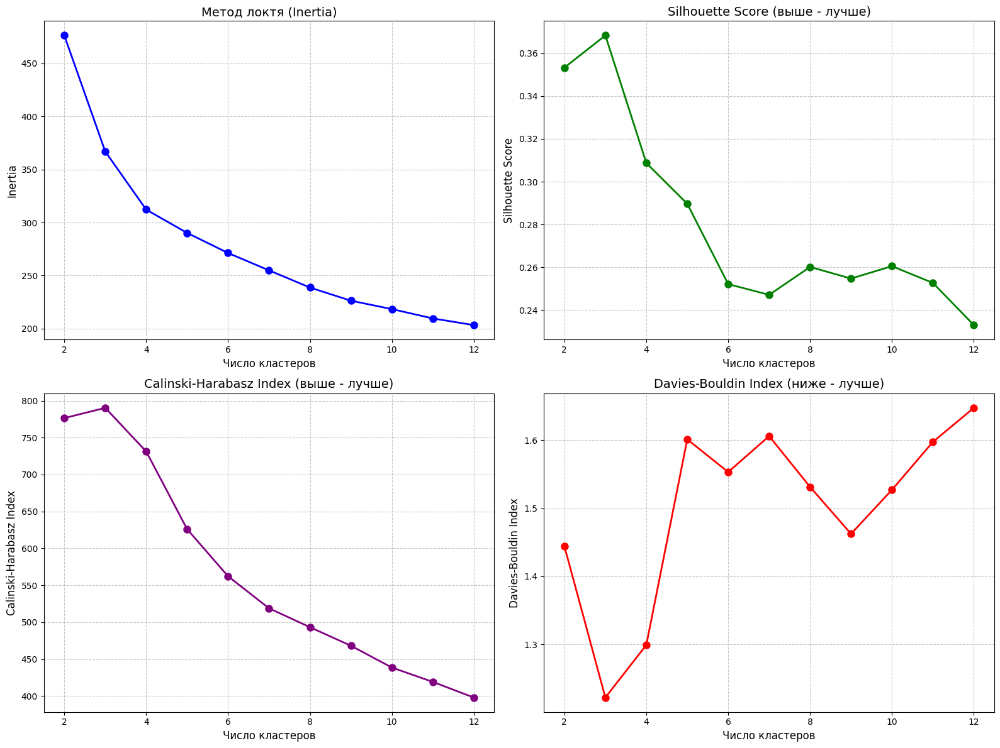


Оптимальное число кластеров по разным метрикам:
Метод локтя (Inertia): 4
Silhouette Score: 3
Calinski-Harabasz Index: 3
Davies-Bouldin Index: 3

Таблица со значениями метрик:


,Число кластеров,Inertia,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,2,476.350469,0.353245,776.489886,1.444026
1,3,366.931736,0.368271,790.333348,1.222330
2,4,312.178083,0.308717,731.284711,1.299380
3,5,290.217669,0.289678,625.977789,1.600978
4,6,271.284492,0.252170,562.238956,1.553023
5,7,254.922250,0.247172,518.863377,1.605729
6,8,238.722698,0.260185,493.255915,1.531204
7,9,226.313816,0.254775,468.158077,1.462372
8,10,218.432855,0.260544,438.606579,1.526977
9,11,209.614716,0.252724,419.189289,1.597298


In [ ]:
# Определяем оптимальное число кластеров
optimal_clusters = find_optimal_clusters(X_scaled, max_k=12)

### **Определение оптимального eps для DBSCAN**

Теперь напишем функцию для автоматического определения оптимального значения параметра eps (радиус соседства) для алгоритма DBSCAN. Этот параметр очень важен для работы алгоритма, так как слишком маленькое значение eps приведет к большому количеству изолированных точек (шума), а слишком большое — к объединению разных кластеров.

Метод использует анализ расстояний до k-го ближайшего соседа (k-distance graph). Точки отсортированы по дистанции, и резкий изгиб на графике (точка "локтя") указывает на оптимальное значение eps. Это значение соответствует переходу между локальной и глобальной плотностями в данных.

Функция автоматически находит точку перегиба с помощью метода Knee Locator или, если это невозможно, предлагает значение на основе 10-го процентиля распределения расстояний до k-ых соседей.

Оптимальное значение eps (точка изгиба): 0.5788


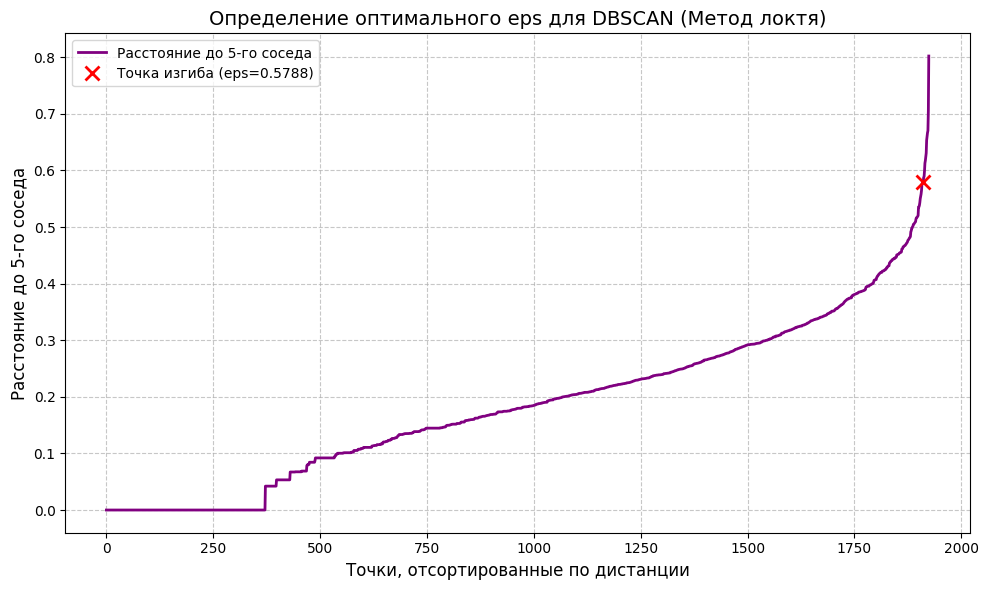

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator

def find_optimal_eps(X, k=5):
    """
    Определение оптимального значения eps для алгоритма DBSCAN
    с визуализацией точки максимального изгиба.
    """
    # Находим расстояния до k-го ближайшего соседа [[1]] [[9]]
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)

    # Берем расстояние до k-го соседа (индекс k-1) и сортируем
    distances = np.sort(distances[:, k-1])
    indices = np.arange(len(distances)) # Индексы для оси X

    # Находим точку максимального изгиба (перегиба) ДО отрисовки
    kl = KneeLocator(indices, distances, curve='convex', direction='increasing')

    # Визуализируем график расстояний
    plt.figure(figsize=(10, 6))
    plt.plot(indices, distances, linewidth=2, color='purple', label=f'Расстояние до {k}-го соседа')
    plt.xlabel('Точки, отсортированные по дистанции', fontsize=12)
    plt.ylabel(f'Расстояние до {k}-го соседа', fontsize=12)
    plt.title('Определение оптимального eps для DBSCAN (Метод локтя)', fontsize=14)

    # Если точка изгиба найдена, отмечаем ее на графике
    if kl.knee is not None:
        optimal_eps = distances[kl.knee]
        plt.plot(kl.knee, optimal_eps, 'rx', markersize=10, mew=2, # Красный крестик, увеличенный размер, толщина линии
                 label=f'Точка изгиба (eps={optimal_eps:.4f})')
        print(f"Оптимальное значение eps (точка изгиба): {optimal_eps:.4f}")
    else:
        optimal_eps = None # Устанавливаем в None, если точка не найдена
        print("Не удалось автоматически определить точку изгиба.")

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend() # Показываем легенду с метками
    plt.tight_layout()
    plt.show()

    # Возвращаем найденное значение или fallback
    if optimal_eps is not None:
        return optimal_eps
    else:
        # Возвращаем примерное значение, если автоматическое определение не удалось

        eps_guess = np.percentile(distances, 10)
        print(f"Предлагаемое значение eps (10-й процентиль): {eps_guess:.4f}")
        return eps_guess


# Определяем оптимальный параметр eps для DBSCAN
optimal_eps = find_optimal_eps(X_scaled, k=5)

## **3. Анализ отдельных алгоритмов кластеризации**



Теперь рассмотрим каждый алгоритм кластеризации по отдельности. Для каждого алгоритма мы будем:
1. Применять алгоритм к нашим данным
2. Оценивать качество кластеризации
3. Визуализировать результаты
4. Анализировать статистику кластеров

### **Вспомогательные функции для анализа алгоримтов кластеризации**

#### **Оценка качества кластеризации**

Для начала напишем функцию для оценки результатов кластеризации с использованием трех основных метрик качества. Эта функция позволит нам объективно сравнивать эффективность различных алгоритмов и выбирать оптимальное решение.

Функция учитывает особенности алгоритмов типа DBSCAN, которые могут помечать некоторые точки как шум (метка -1), корректно рассчитывая число кластеров. Также проверяет минимальное требование для расчета метрик - наличие как минимум двух кластеров.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clustering(X, labels, algorithm_name):
    """
    Оценка качества кластеризации по различным метрикам
    """
    n_clusters = len(np.unique(labels))
    if -1 in labels:  # Исключаем шумовые точки для DBSCAN/HDBSCAN
        n_clusters -= 1

    metrics = {}

    if n_clusters > 1:  # Все метрики требуют минимум 2 кластера
        metrics['silhouette'] = silhouette_score(X, labels)
        metrics['calinski'] = calinski_harabasz_score(X, labels)
        metrics['davies'] = davies_bouldin_score(X, labels)
    else:
        metrics['silhouette'] = np.nan
        metrics['calinski'] = np.nan
        metrics['davies'] = np.nan

    print(f"\nМетрики качества кластеризации для {algorithm_name}:")
    print(f"Количество кластеров: {n_clusters}")
    print(f"Silhouette Score: {metrics['silhouette']:.4f}")
    print(f"Calinski-Harabasz Index: {metrics['calinski']:.4f}")
    print(f"Davies-Bouldin Index: {metrics['davies']:.4f}")

    return metrics

#### **Визуализация результатов кластеризации**

Далее напишем функцию для наглядного представления результатов кластеризации. Поскольку наши данные многомерные, для визуализации необходимо снизить размерность до двух измерений с помощью метода главных компонент (PCA).

Функция создаст два информативных графика:
1. **Диаграмма рассеяния в пространстве главных компонент** — показывает как разделились данные на кластеры, с отмеченными центрами каждого кластера
2. **Тепловая карта средних значений признаков** — позволяет понять характеристики каждого кластера по исходным признакам

Это даст нам возможность оценить качество кластеризации визуально и интерпретировать полученные группы с точки зрения исходных параметров. Функция также отображает процент сохраненной дисперсии для каждой главной компоненты, что позволяет оценить, насколько хорошо двумерное представление отражает структуру исходных данных.

In [ ]:
def visualize_clusters_2d(X, labels, algorithm_name, features, X_original=None):
    """
    Визуализация результатов кластеризации с помощью PCA

    Parameters:
    X -- масштабированные данные (для PCA)
    labels -- метки кластеров
    algorithm_name -- название алгоритма
    features -- названия признаков
    X_original -- исходные данные (для тепловой карты, если None, используется X)
    """
    # Уменьшаем размерность до 2D с помощью PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Создаем DataFrame для визуализации
    viz_df = pd.DataFrame({
        'PC1': X_pca[:, 0],
        'PC2': X_pca[:, 1],
        'cluster': labels
    })

    # Визуализируем результаты
    plt.figure(figsize=(12, 8))
    scatter = sns.scatterplot(
        x='PC1', y='PC2',
        hue='cluster',
        data=viz_df,
        palette='viridis',
        s=80,
        alpha=0.7
    )

    # Добавляем центры кластеров (если есть)
    unique_clusters = np.unique(labels)
    for cluster in unique_clusters:
        if cluster != -1:  # Пропускаем шумовые точки
            cluster_center = X_pca[labels == cluster].mean(axis=0)
            plt.annotate(f'Кластер {cluster}',
                       xy=(cluster_center[0], cluster_center[1]),
                       fontsize=12,
                       color='black',
                       fontweight='bold',
                       bbox=dict(boxstyle="round,pad=0.3", fc='white', alpha=0.7))

    plt.title(f'Кластеризация методом {algorithm_name}', fontsize=15)

    # Добавляем информацию о доле сохраненной дисперсии
    explained_variance = pca.explained_variance_ratio_
    plt.xlabel(f'PC1 ({explained_variance[0]:.2%} дисперсии)', fontsize=12)
    plt.ylabel(f'PC2 ({explained_variance[1]:.2%} дисперсии)', fontsize=12)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Для тепловой карты используем X_original если передан, иначе X
    heatmap_data = X_original if X_original is not None else X

    # Создаем тепловую карту средних значений признаков по кластерам
    # Вычисляем средние значения признаков для каждого кластера
    cluster_means = []
    cluster_labels = []

    for cluster in unique_clusters:
        if cluster != -1:  # Пропускаем шумовые точки
            cluster_data = heatmap_data[labels == cluster]
            cluster_means.append(cluster_data.mean(axis=0))
            cluster_labels.append(f'Кластер {cluster}')

    # Создаем DataFrame для тепловой карты
    if len(cluster_means) > 0:
        cluster_means_df = pd.DataFrame(
            cluster_means,
            index=cluster_labels,
            columns=features
        )

        # Визуализируем тепловую карту
        plt.figure(figsize=(14, 8))
        sns.heatmap(cluster_means_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

        if X_original is not None:
            plt.title(f'Средние значения признаков по кластерам ({algorithm_name}) - реальные значения', fontsize=15)
        else:
            plt.title(f'Средние значения признаков по кластерам ({algorithm_name}) - масштабированные', fontsize=15)

        plt.tight_layout()
        plt.show()
    else:
        print("Не удалось построить тепловую карту: нет кластеров (кроме шума)")

    return explained_variance

#### **Анализ характеристик полученных кластеров**



Напишем функцию для детального анализа результатов кластеризации. Это позволит нам понять структуру и особенности обнаруженных групп объектов.

Функция выполняет следующие операции:
1. Подсчитывает количество объектов в каждом кластере и их процентное соотношение
2. Вычисляет основные статистические показатели для каждого кластера:
   - Средние значения всех признаков
   - Минимальные значения (нижние границы)
   - Максимальные значения (верхние границы)
3. Строит боксплоты для визуализации распределения каждого признака в разрезе кластеров

Такой многосторонний анализ поможет нам интерпретировать результаты кластеризации, понять значимые различия между группами и присвоить им содержательные названия на основе характерных особенностей.

In [ ]:
def analyze_clusters(X, labels, algorithm_name, features):
    """
    Подробный анализ результатов кластеризации
    """
    unique_clusters = np.unique(labels)
    n_clusters = len(unique_clusters)
    if -1 in unique_clusters:  # Исключаем шумовые точки для DBSCAN/HDBSCAN
        n_clusters -= 1

    print(f"\n--- Анализ кластеров для метода {algorithm_name} ---")
    print(f"Количество кластеров: {n_clusters}")

    # Распределение точек по кластерам
    cluster_counts = pd.Series(labels).value_counts().sort_index()
    cluster_percents = (cluster_counts / len(labels) * 100).round(2)

    print("\nРаспределение точек по кластерам:")
    distribution_df = pd.DataFrame({
        'Количество точек': cluster_counts,
        'Процент': cluster_percents
    })
    display(distribution_df)

    # Создаем DataFrame с данными и метками кластеров
    X_with_labels = pd.DataFrame(X, columns=features)
    X_with_labels['cluster'] = labels

    # Статистика по кластерам
    print("\nСредние значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').mean())

    print("\nМинимальные значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').min())

    print("\nМаксимальные значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').max())

    # Визуализируем распределение для каждого признака по кластерам
    for feature in features:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x='cluster', y=feature, data=X_with_labels)
        plt.title(f'Распределение {feature} по кластерам ({algorithm_name})', fontsize=15)
        plt.xlabel('Кластер', fontsize=12)
        plt.ylabel(feature, fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

    return X_with_labels

### **3.1. K-means кластеризация**

In [ ]:
# Выбираем число кластеров по умолчанию я выбираю по критерию inertia,
# но Вы можете установить более оптимальное значения для Вашего случая

k = optimal_clusters['silhouette']
print(f"Выбрано число кластеров: {k}")

Выбрано число кластеров: 3


In [ ]:
# Применение алгоритма K-means
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
kmeans_metrics = evaluate_clustering(X_scaled, kmeans_labels, "K-means")


Метрики качества кластеризации для K-means:
Количество кластеров: 3
Silhouette Score: 0.3683
Calinski-Harabasz Index: 790.3333
Davies-Bouldin Index: 1.2223


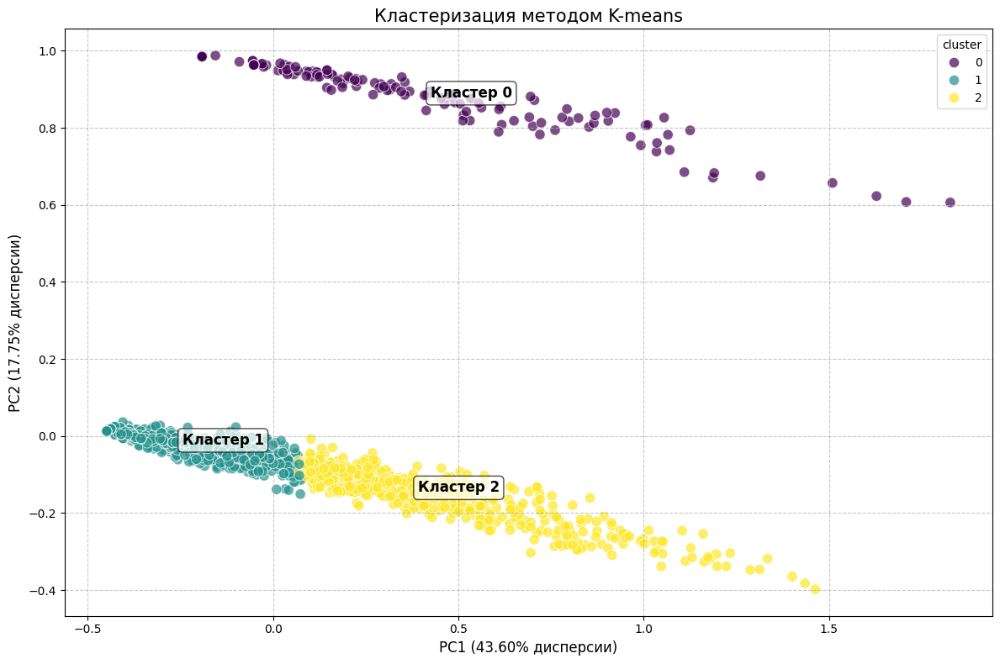

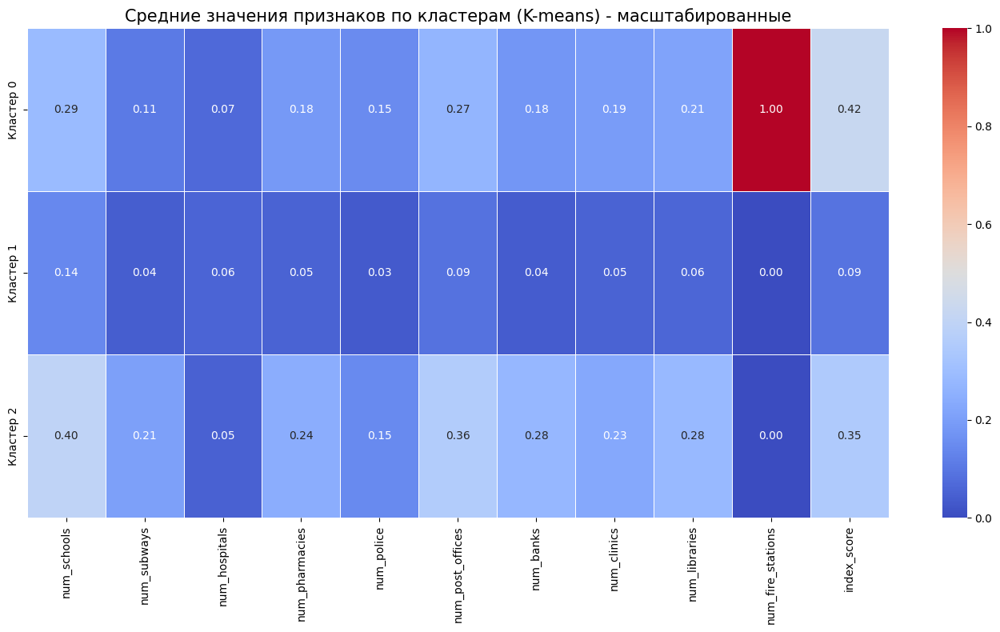

In [ ]:
# Визуализация результатов
explained_variance = visualize_clusters_2d(X_scaled, kmeans_labels, "K-means", features)


--- Анализ кластеров для метода K-means ---
Количество кластеров: 3

Распределение точек по кластерам:


,Количество точек,Процент
0,130,6.75
1,1190,61.82
2,605,31.43



Средние значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.288112,0.106154,0.068132,0.183654,0.149451,0.268132,0.179352,0.191538,0.213462,1.0,0.422816
1,0.141329,0.041513,0.055822,0.053922,0.034574,0.086555,0.038788,0.051849,0.059034,0.0,0.089958
2,0.396243,0.205179,0.050059,0.244628,0.147107,0.357969,0.277164,0.227769,0.283884,0.0,0.349688



Минимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.159674
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.196897



Максимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.818182,0.533333,0.714286,0.666667,1.000000,0.857143,0.894737,0.7,0.75,1.0,1.000000
1,0.636364,0.733333,1.000000,0.375000,0.428571,0.571429,0.473684,0.6,0.75,0.0,0.294015
2,1.000000,1.000000,0.857143,1.000000,0.857143,1.000000,1.000000,1.0,1.00,0.0,0.768184


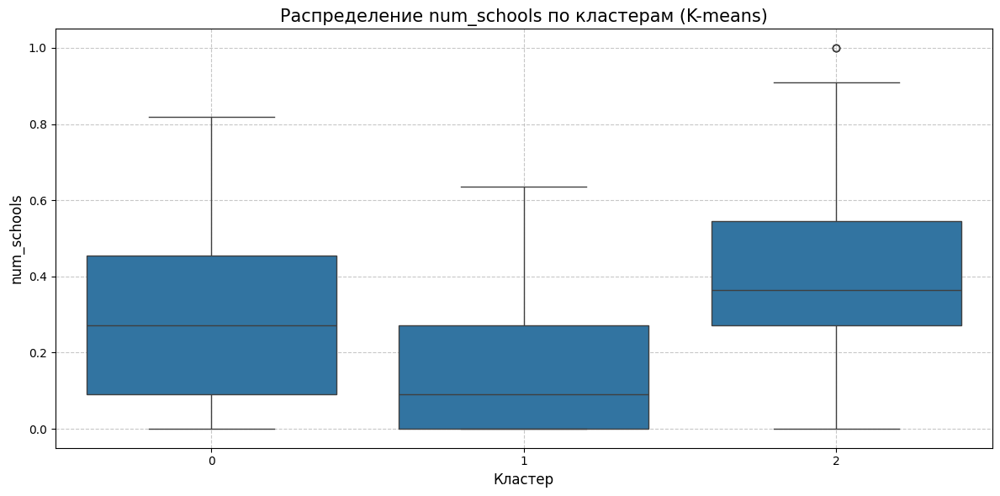

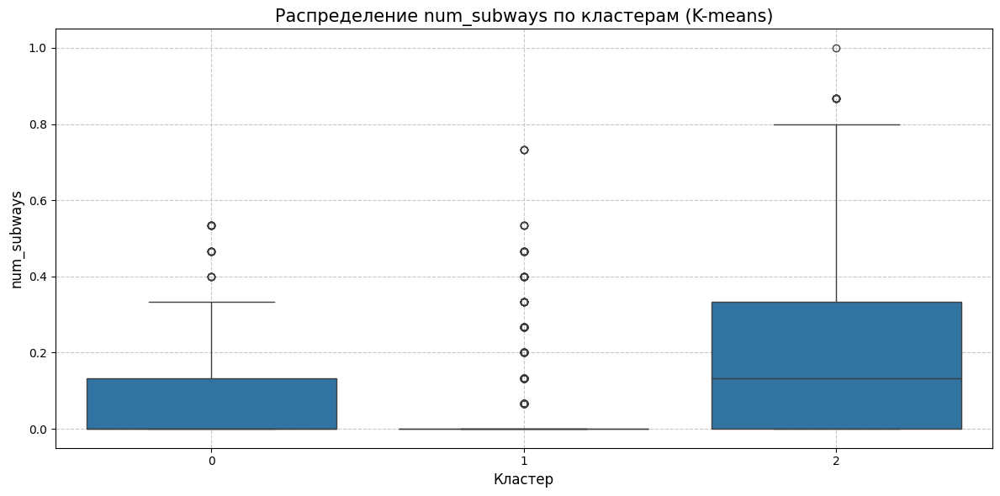

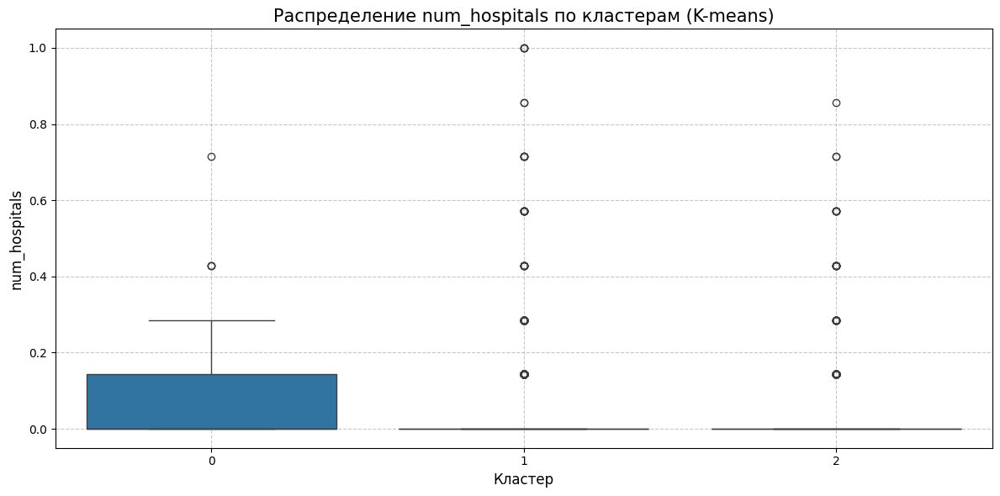

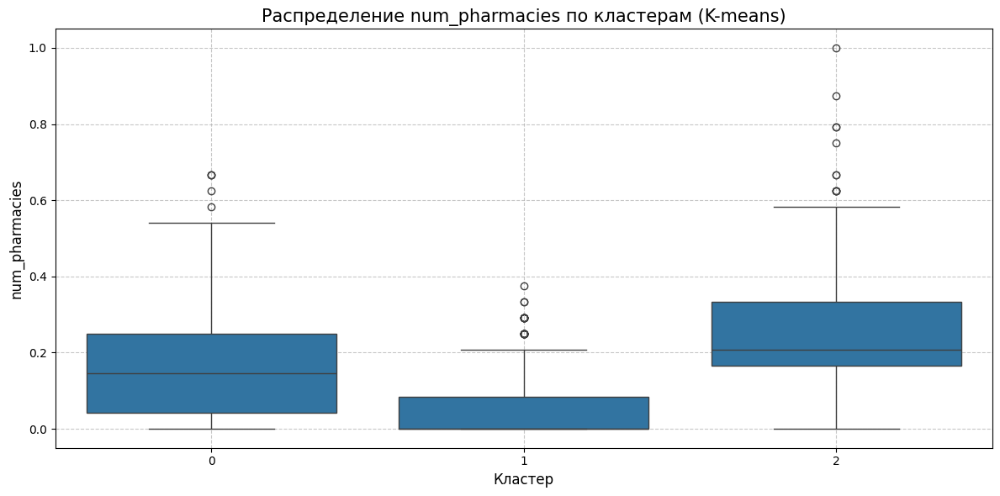

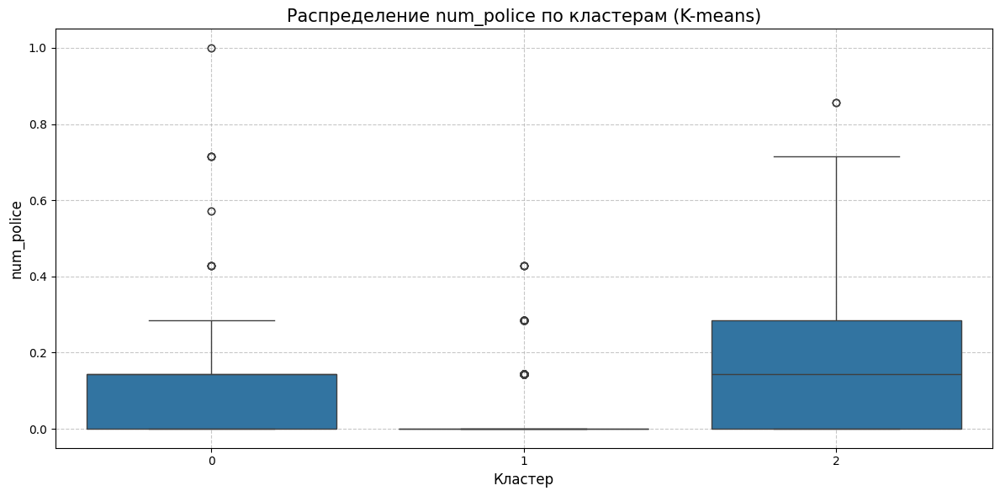

...

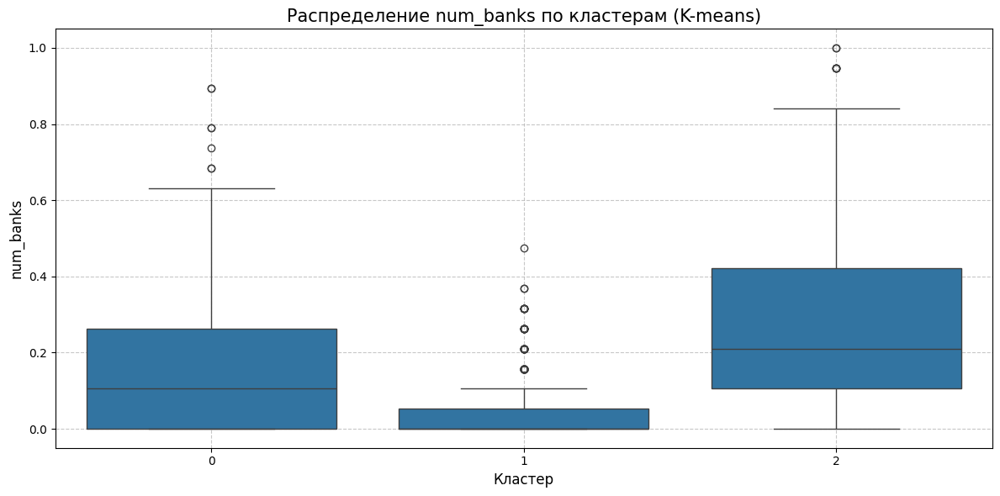

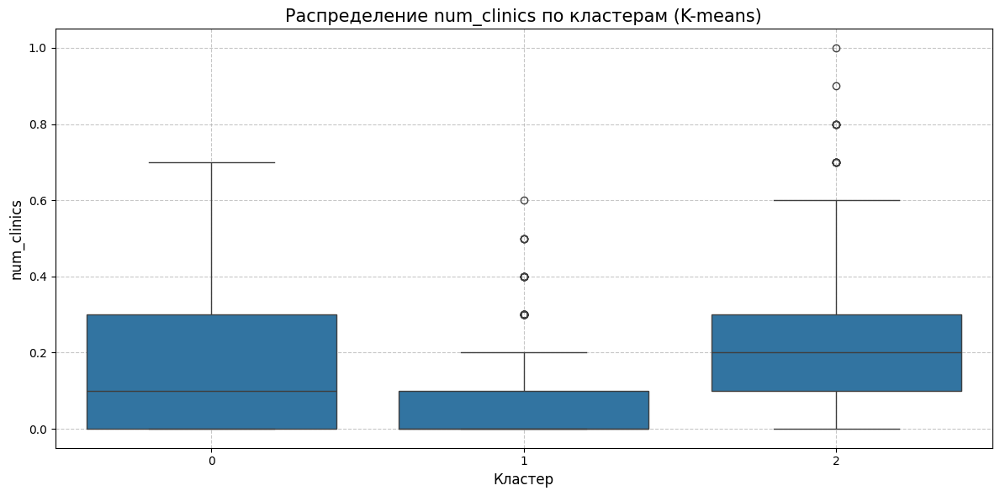

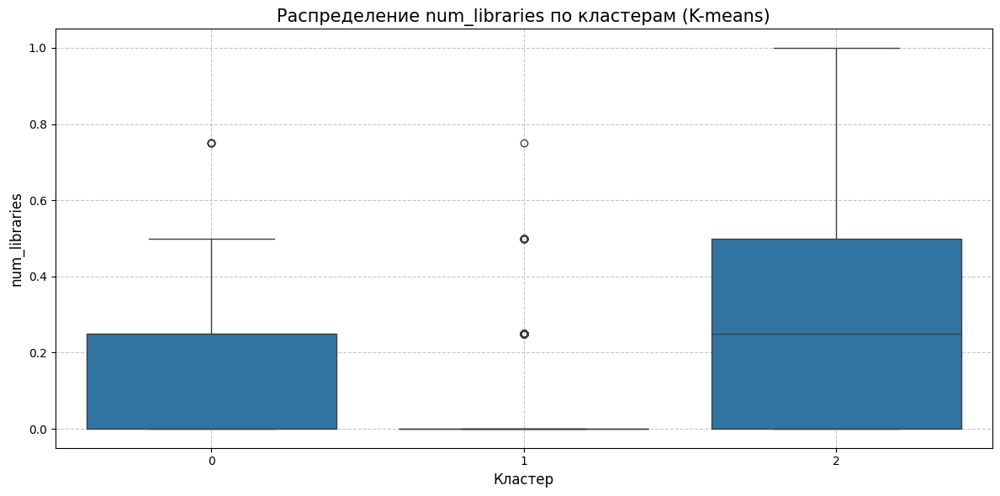

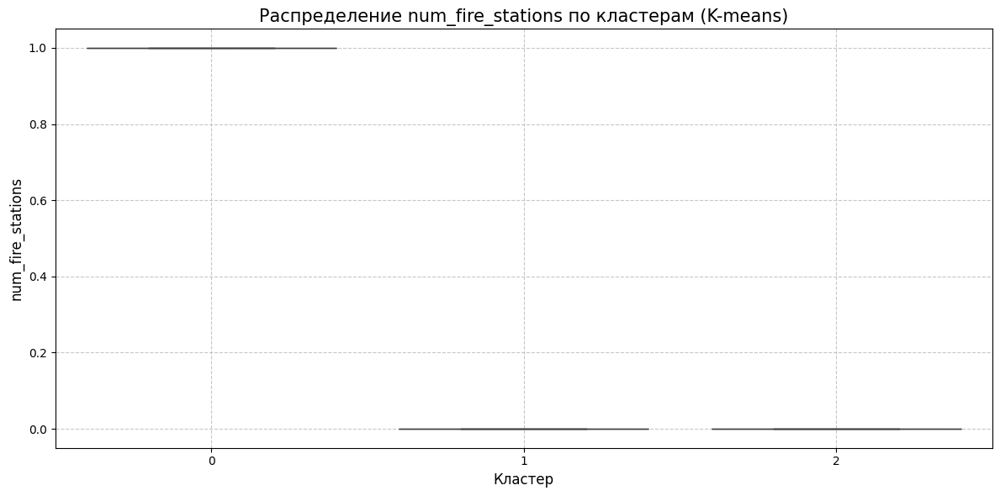

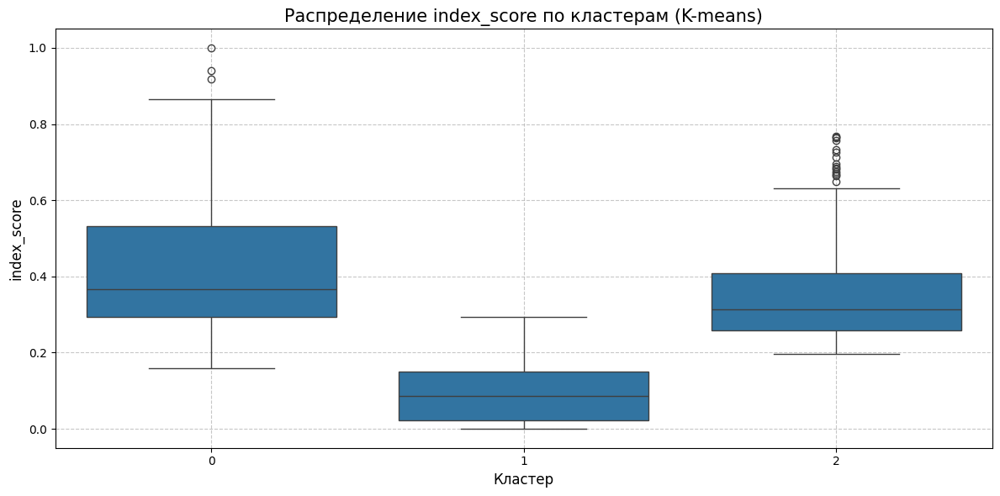

In [ ]:
# Анализ кластеров
kmeans_analysis = analyze_clusters(X_scaled, kmeans_labels, "K-means", features)

### **3.2. Агломеративная кластеризация**

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Применение агломеративной кластеризации
agglom = AgglomerativeClustering(n_clusters=k)
agglom_labels = agglom.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
agglom_metrics = evaluate_clustering(X_scaled, agglom_labels, "Агломеративная кластеризация")


Метрики качества кластеризации для Агломеративная кластеризация:
Количество кластеров: 3
Silhouette Score: 0.3727
Calinski-Harabasz Index: 709.8076
Davies-Bouldin Index: 1.2525


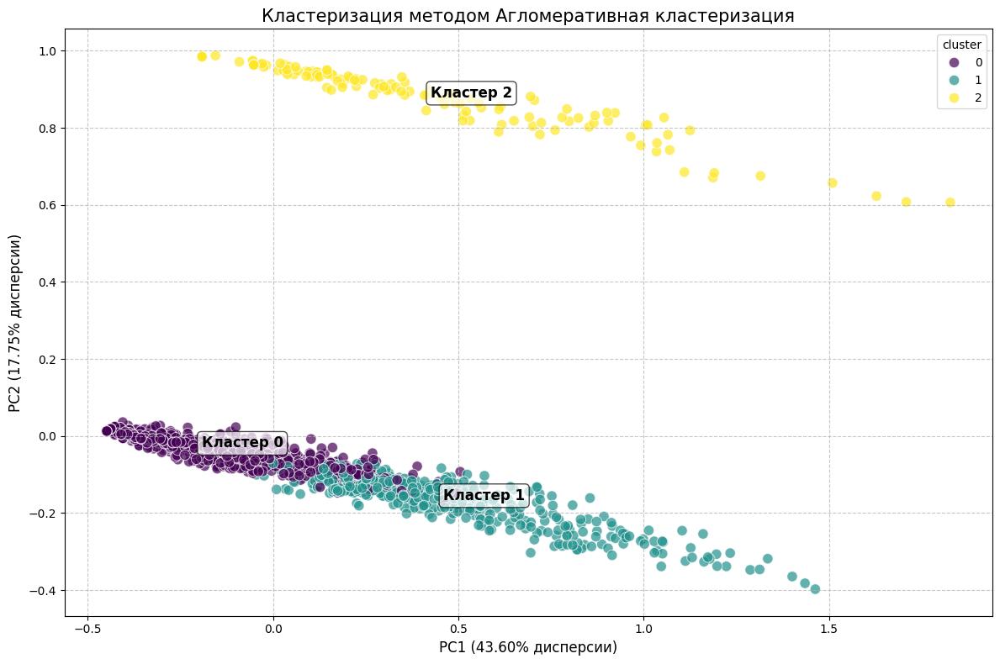

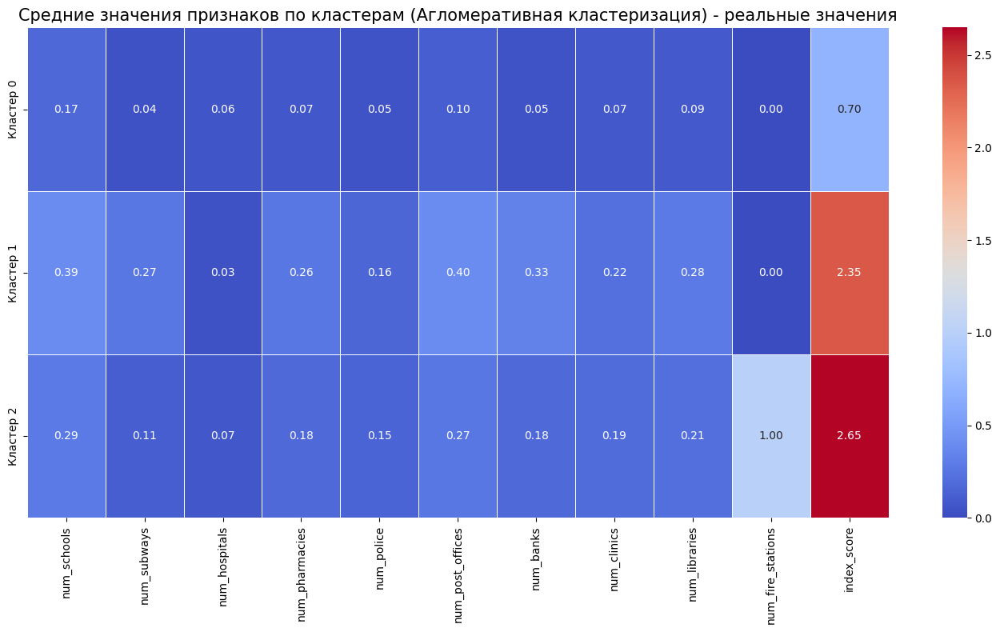

array([0.43596157, 0.17749925])

In [ ]:
# Визуализация результатов
visualize_clusters_2d(
    X_scaled,
    agglom_labels,
    "Агломеративная кластеризация",
    features,
    X_original=h3_gdf[features].values if all(f in h3_gdf.columns for f in features) else None
)


--- Анализ кластеров для метода Агломеративная кластеризация ---
Количество кластеров: 3

Распределение точек по кластерам:


,Количество точек,Процент
0,1349,70.08
1,446,23.17
2,130,6.75



Средние значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.171912,0.039881,0.060256,0.070206,0.045113,0.104734,0.048925,0.073758,0.085804,0.0,0.111866
1,0.394619,0.268460,0.034593,0.263359,0.155349,0.399744,0.331485,0.224215,0.283072,0.0,0.376017
2,0.288112,0.106154,0.068132,0.183654,0.149451,0.268132,0.179352,0.191538,0.213462,1.0,0.422816



Минимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166995
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.159674



Максимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.818182,0.600000,1.000000,0.583333,0.571429,0.571429,0.421053,0.8,0.75,0.0,0.490284
1,1.000000,1.000000,0.571429,1.000000,0.857143,1.000000,1.000000,1.0,1.00,0.0,0.768184
2,0.818182,0.533333,0.714286,0.666667,1.000000,0.857143,0.894737,0.7,0.75,1.0,1.000000


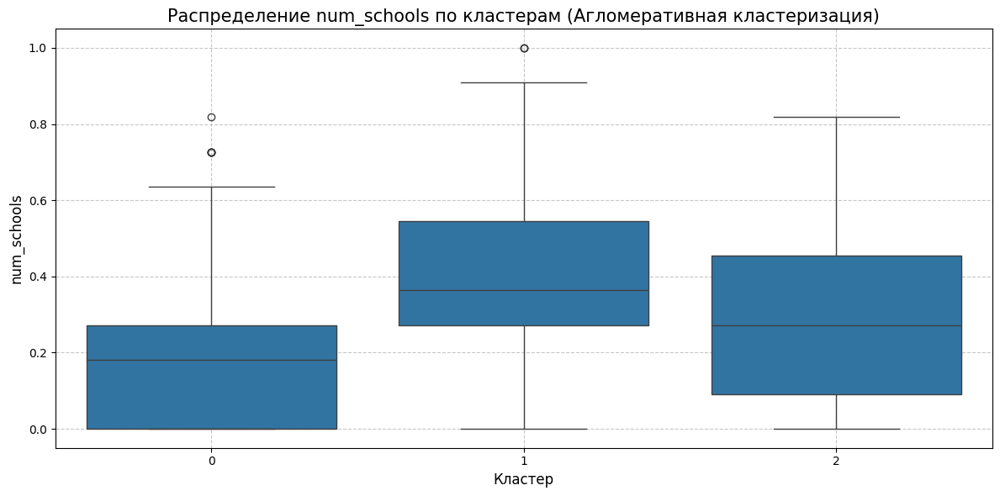

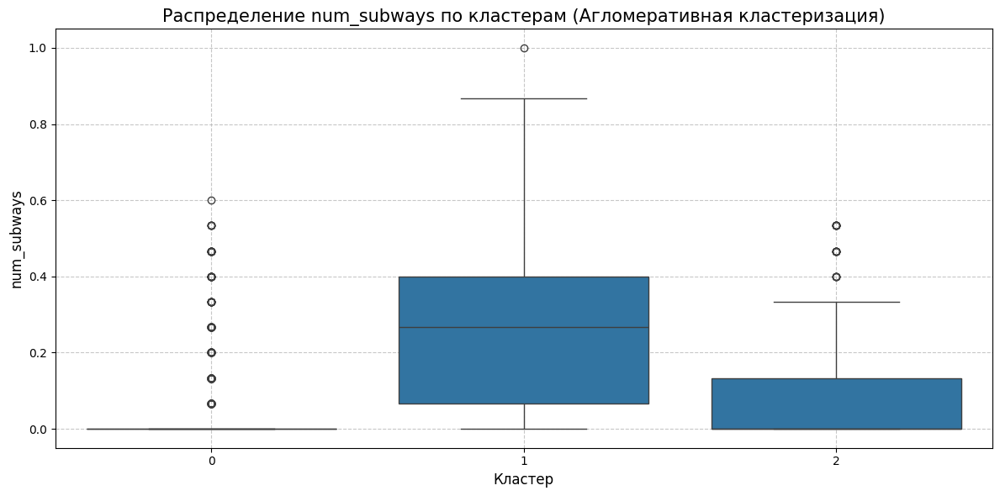

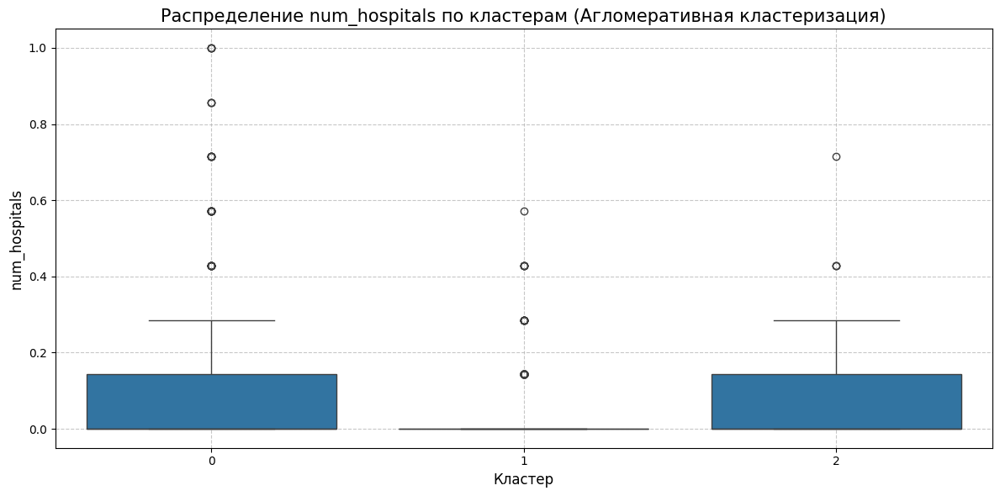

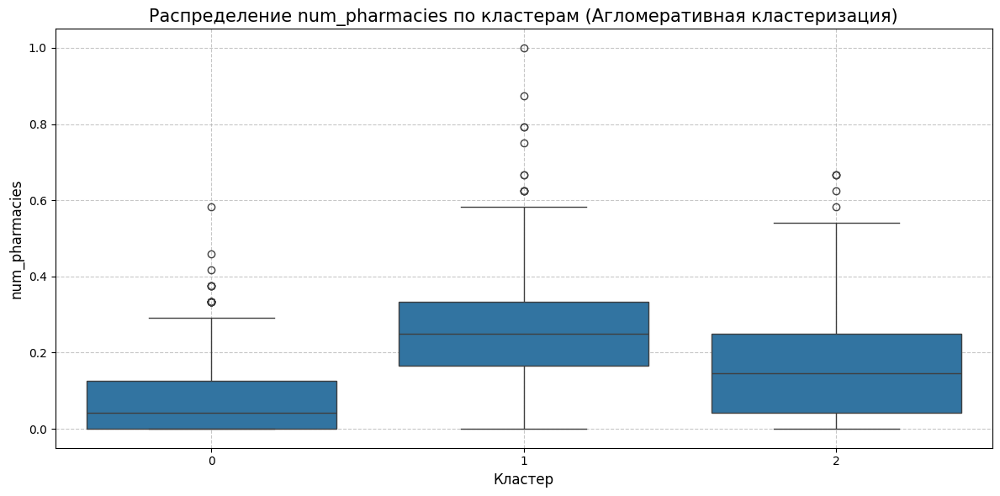

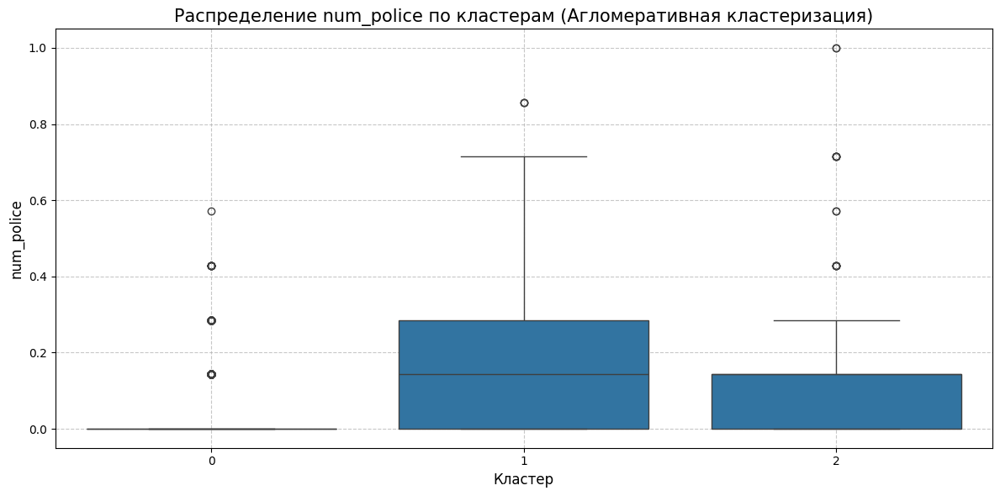

...

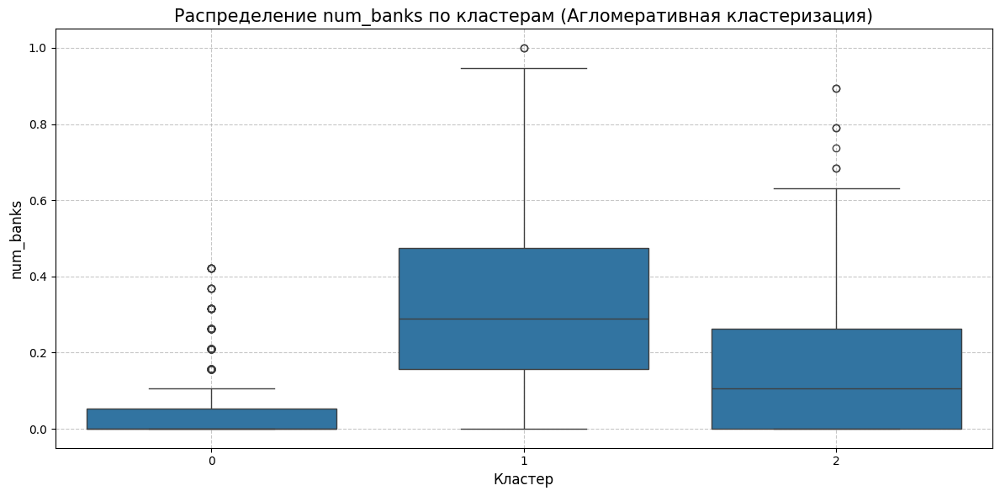

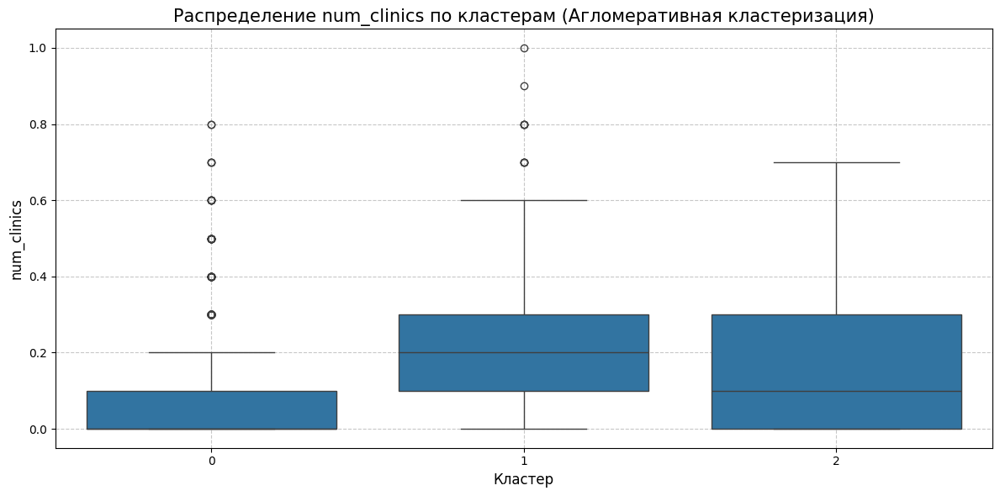

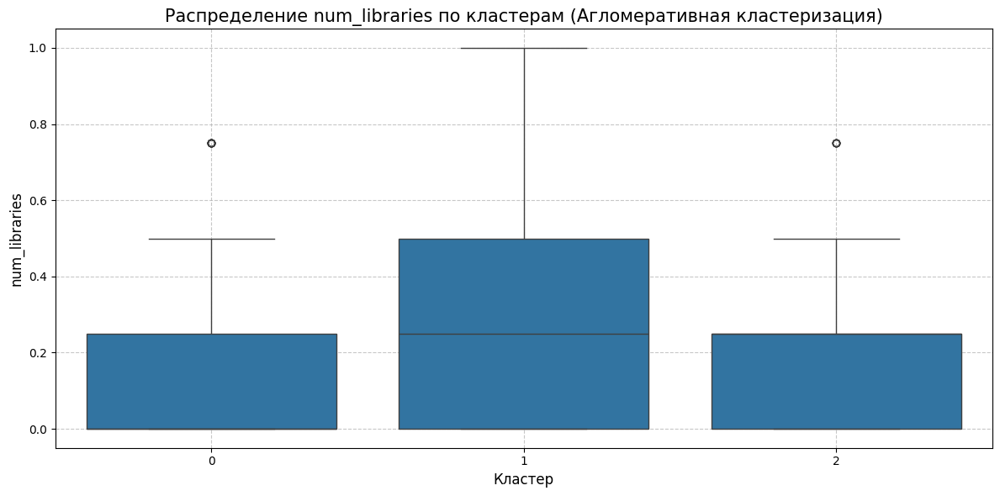

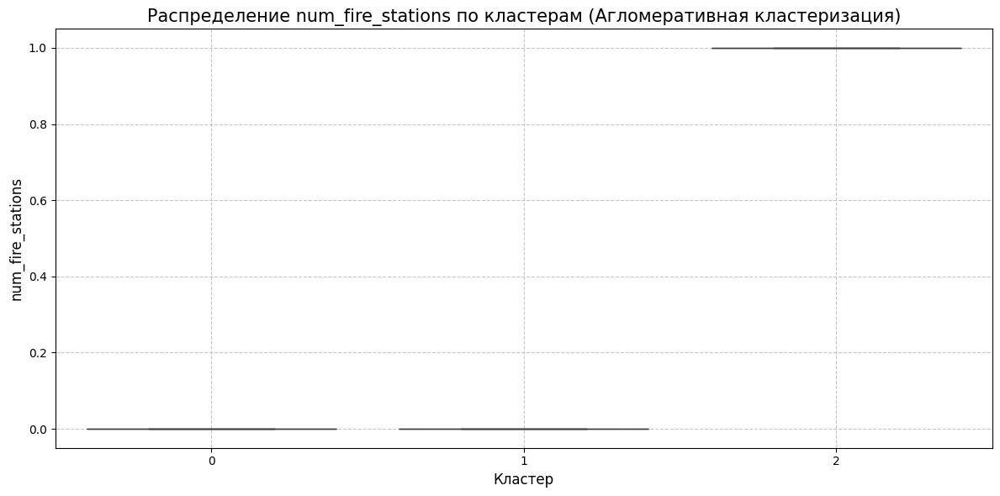

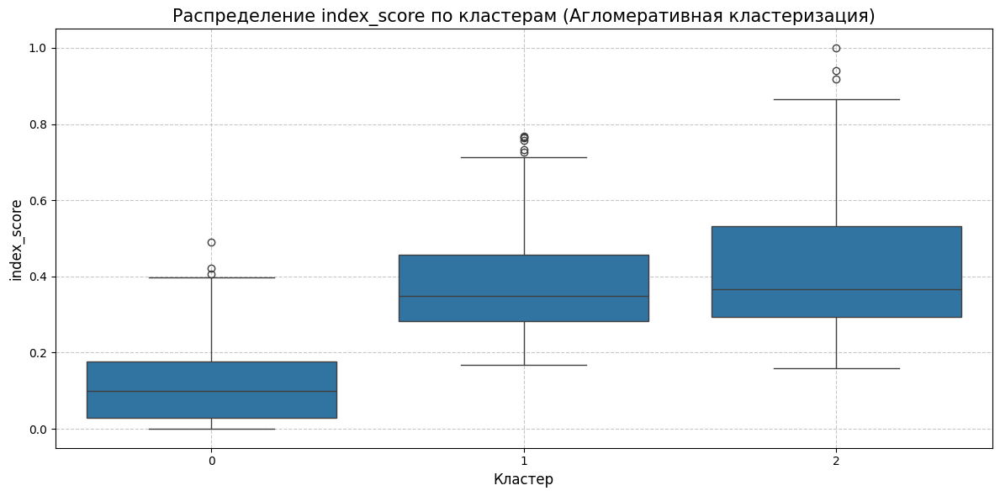

In [ ]:
# Анализ кластеров
agglom_analysis = analyze_clusters(X_scaled, agglom_labels, "Агломеративная кластеризация", features)

### **3.3. Спектральная кластеризация**

In [ ]:
from sklearn.cluster import SpectralClustering

# Применение спектральной кластеризации
spectral = SpectralClustering(n_clusters=k, random_state=42, affinity='nearest_neighbors')
spectral_labels = spectral.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
spectral_metrics = evaluate_clustering(X_scaled, spectral_labels, "Спектральная кластеризация")


Метрики качества кластеризации для Спектральная кластеризация:
Количество кластеров: 3
Silhouette Score: 0.0172
Calinski-Harabasz Index: 356.5518
Davies-Bouldin Index: 1.0060


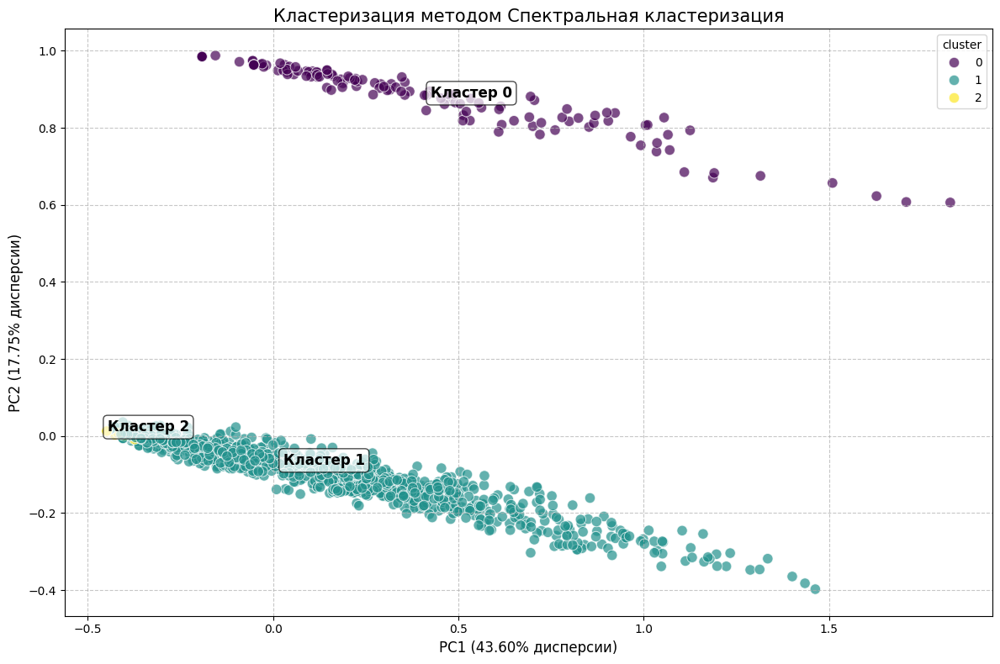

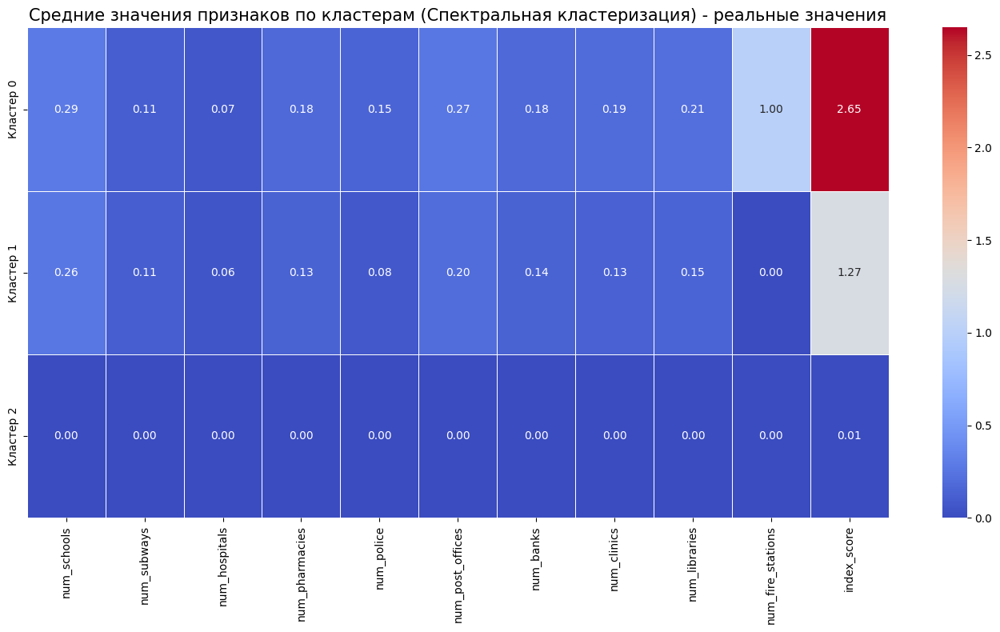

array([0.43596157, 0.17749925])

In [ ]:
# Визуализация результатов
visualize_clusters_2d(
    X_scaled,
    spectral_labels,
    "Спектральная кластеризация",
    features,
    X_original=h3_gdf[features].values if all(f in h3_gdf.columns for f in features) else None
)


--- Анализ кластеров для метода Спектральная кластеризация ---
Количество кластеров: 3

Распределение точек по кластерам:


,Количество точек,Процент
0,130,6.75
1,1574,81.77
2,221,11.48



Средние значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.288112,0.106154,0.068132,0.183654,0.149451,0.268132,0.179352,0.191538,0.213462,1.0,0.422816
1,0.259154,0.110080,0.061445,0.134477,0.082683,0.203031,0.135592,0.126747,0.153748,0.0,0.202301
2,0.000000,0.001207,0.000000,0.002262,0.000000,0.000000,0.001905,0.000000,0.000000,0.0,0.000858



Минимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.159674
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.014516
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000



Максимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
0,0.818182,0.533333,0.714286,0.666667,1.000000,0.857143,0.894737,0.7,0.75,1.0,1.000000
1,1.000000,1.000000,1.000000,1.000000,0.857143,1.000000,1.000000,1.0,1.00,0.0,0.768184
2,0.000000,0.066667,0.000000,0.083333,0.000000,0.000000,0.105263,0.0,0.00,0.0,0.032355


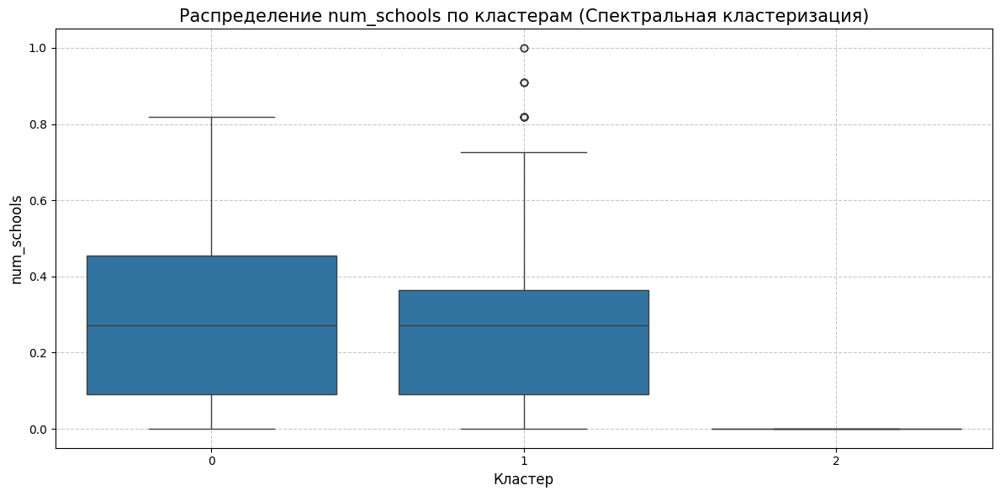

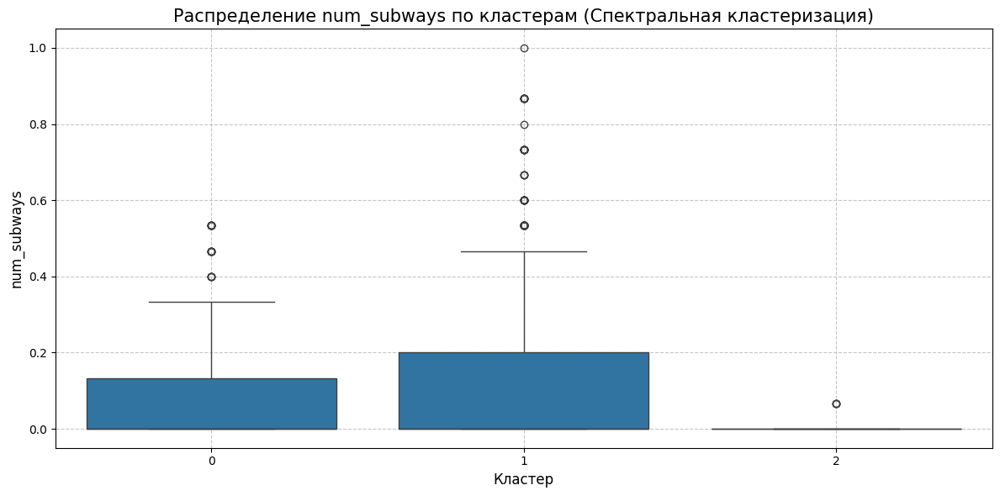

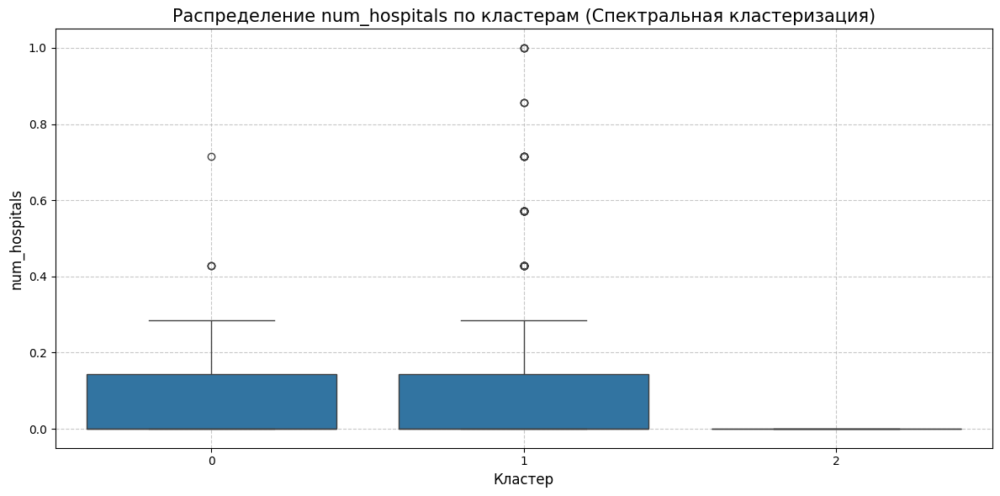

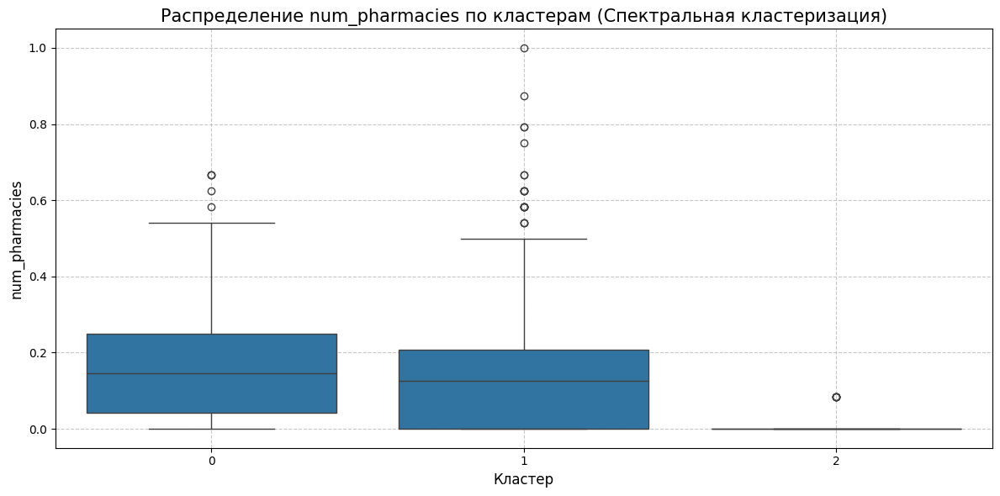

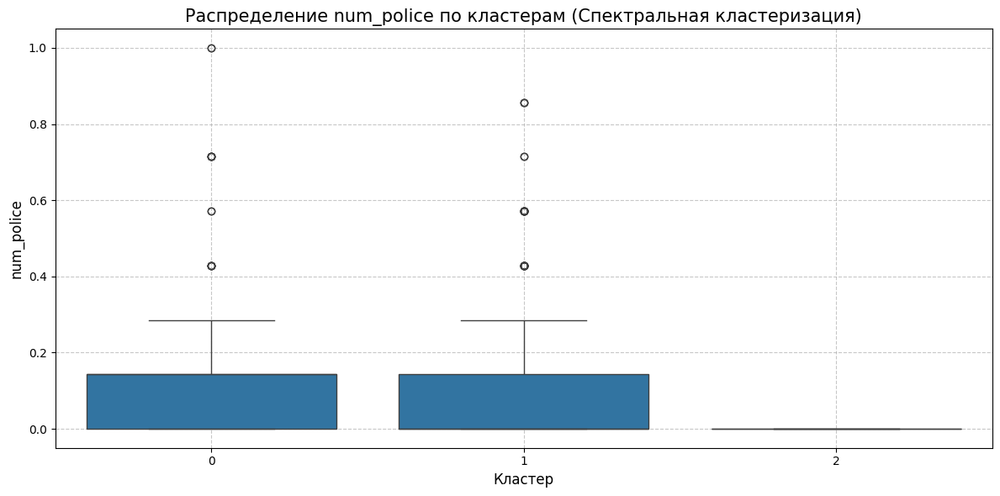

...

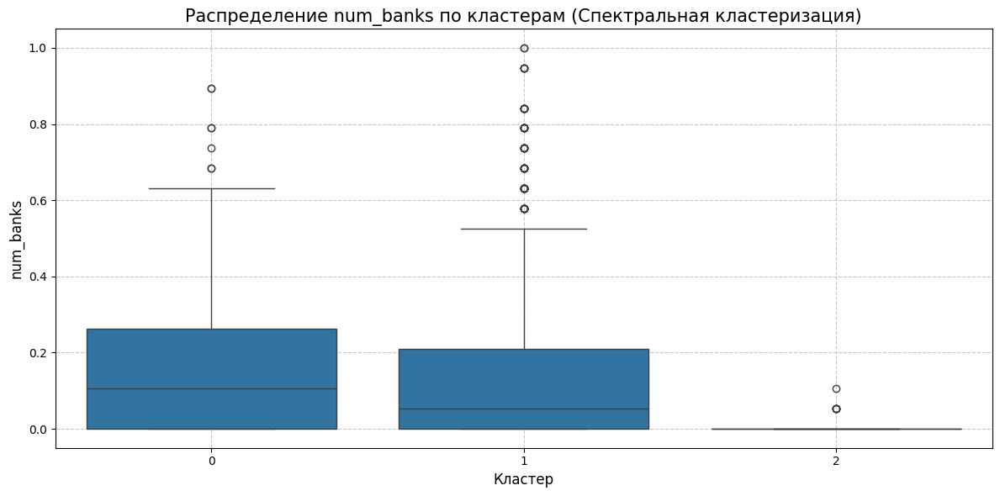

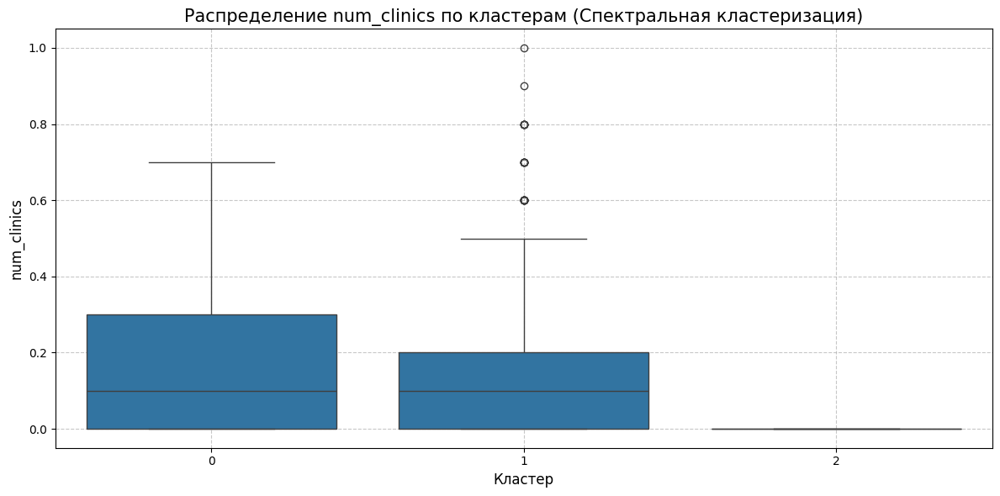

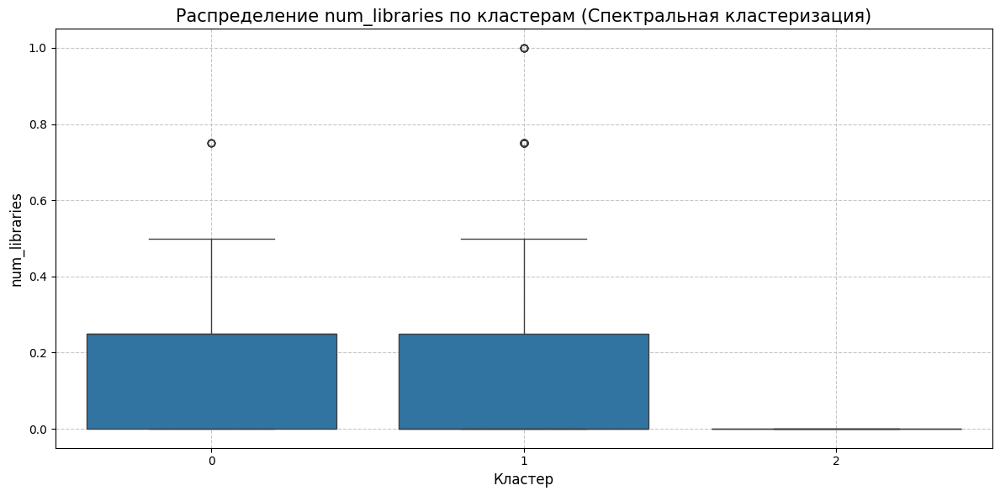

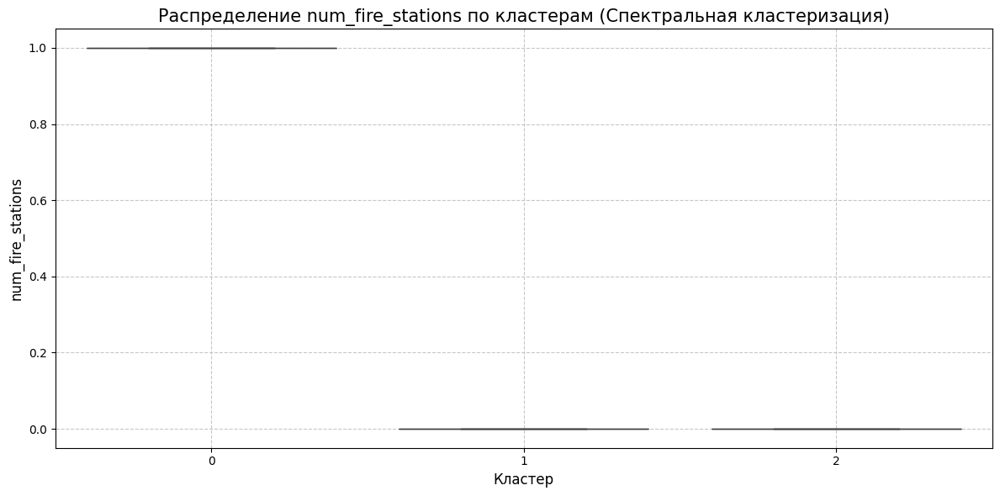

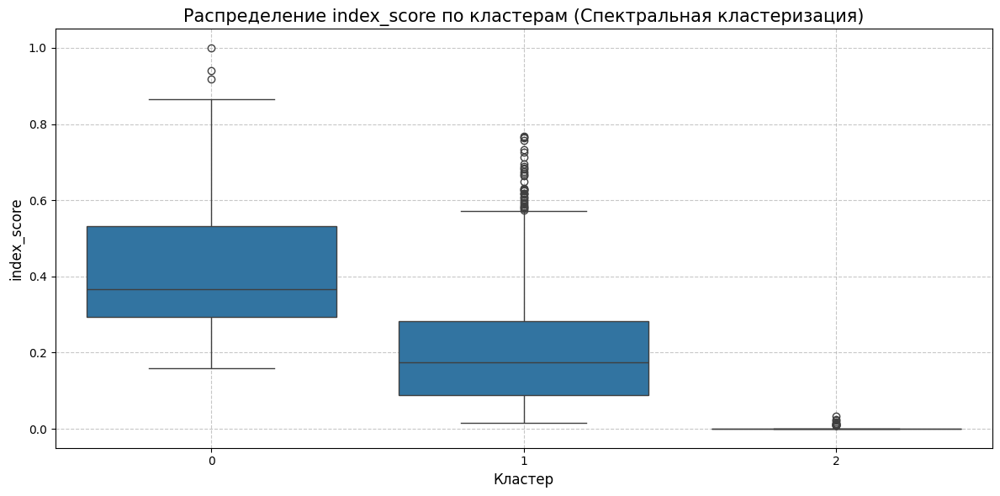

In [ ]:
# Анализ кластеров
spectral_analysis = analyze_clusters(X_scaled, spectral_labels, "Спектральная кластеризация", features)

### **3.4. DBSCAN**

In [ ]:
from sklearn.cluster import DBSCAN

# Применение DBSCAN
dbscan = DBSCAN(eps=optimal_eps, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
dbscan_metrics = evaluate_clustering(X_scaled, dbscan_labels, "DBSCAN")


Метрики качества кластеризации для DBSCAN:
Количество кластеров: 2
Silhouette Score: 0.4753
Calinski-Harabasz Index: 247.6045
Davies-Bouldin Index: 1.2095


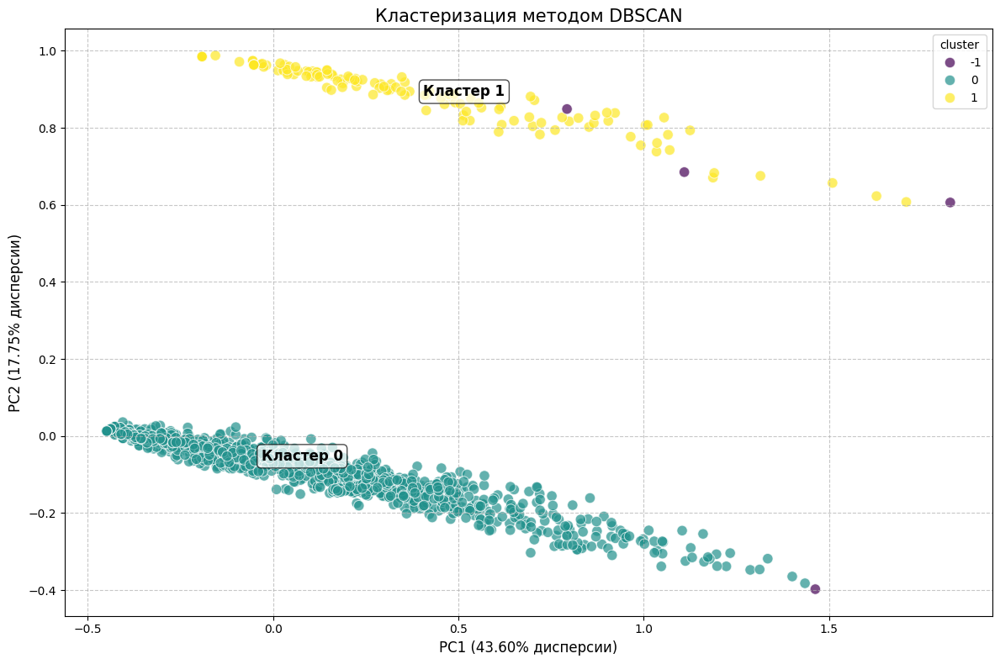

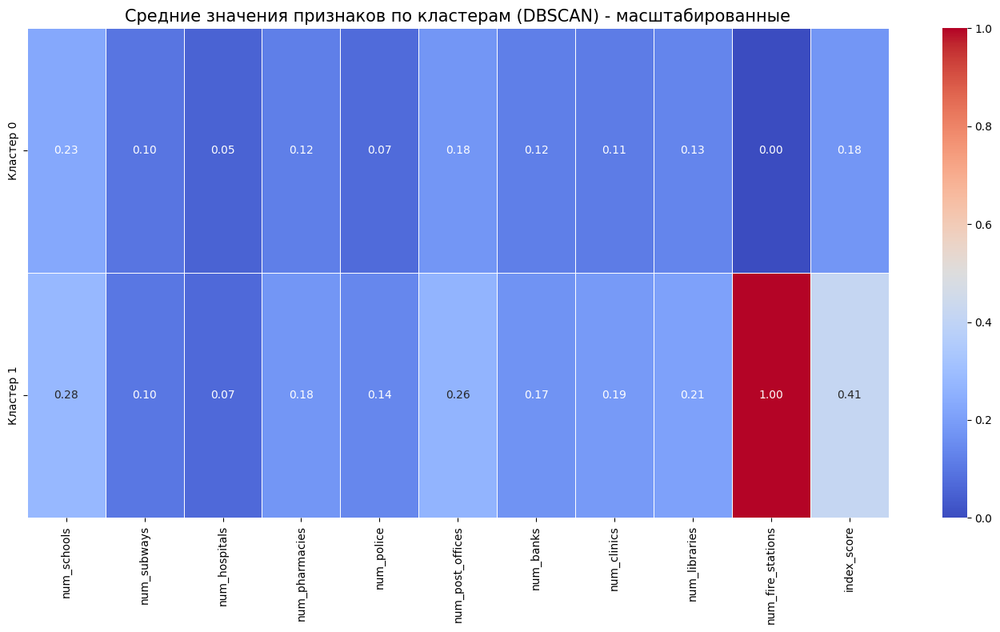

array([0.43596157, 0.17749925])

In [ ]:
# Визуализация результатов
visualize_clusters_2d(X_scaled, dbscan_labels, "DBSCAN", features)


--- Анализ кластеров для метода DBSCAN ---
Количество кластеров: 2

Распределение точек по кластерам:


,Количество точек,Процент
-1,4,0.21
0,1794,93.19
1,127,6.60



Средние значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,0.704545,0.500000,0.000000,0.364583,0.428571,0.642857,0.605263,0.350000,0.437500,0.75,0.763774
0,0.227019,0.096321,0.053910,0.118102,0.072464,0.177576,0.118729,0.110981,0.134476,0.00,0.177171
1,0.277738,0.098688,0.069741,0.178806,0.140607,0.262092,0.171156,0.188189,0.210630,1.00,0.414778



Минимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,0.636364,0.2,0.0,0.166667,0.0,0.142857,0.210526,0.2,0.0,0.0,0.612868
0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000
1,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.0,0.159674



Максимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,0.818182,0.733333,0.000000,0.625000,1.000000,1.000000,0.842105,0.5,0.75,1.0,1.000000
0,1.000000,1.000000,1.000000,1.000000,0.857143,1.000000,1.000000,1.0,1.00,0.0,0.768184
1,0.818182,0.533333,0.714286,0.666667,1.000000,0.857143,0.894737,0.7,0.75,1.0,0.939684


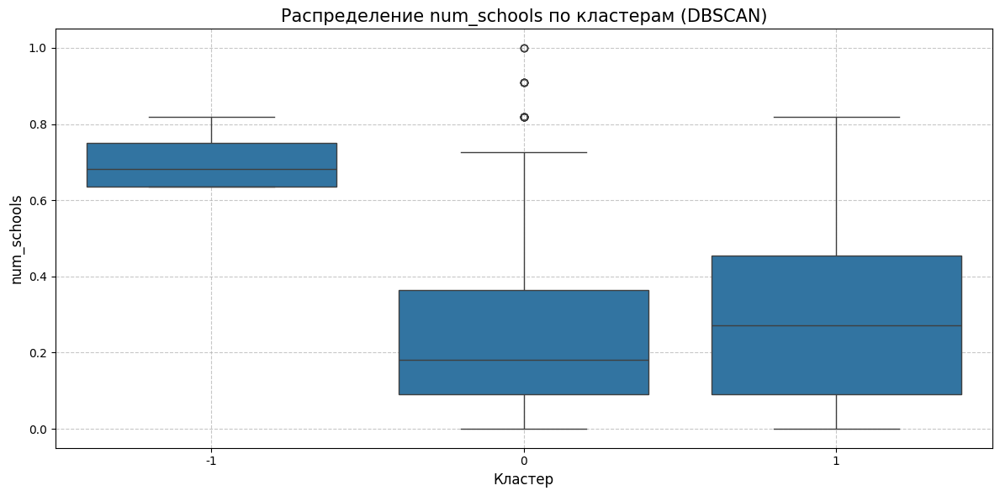

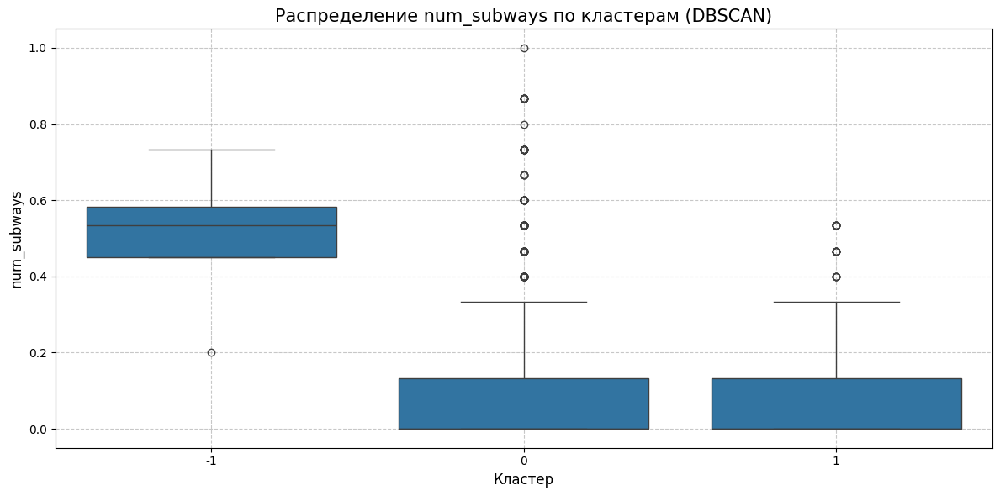

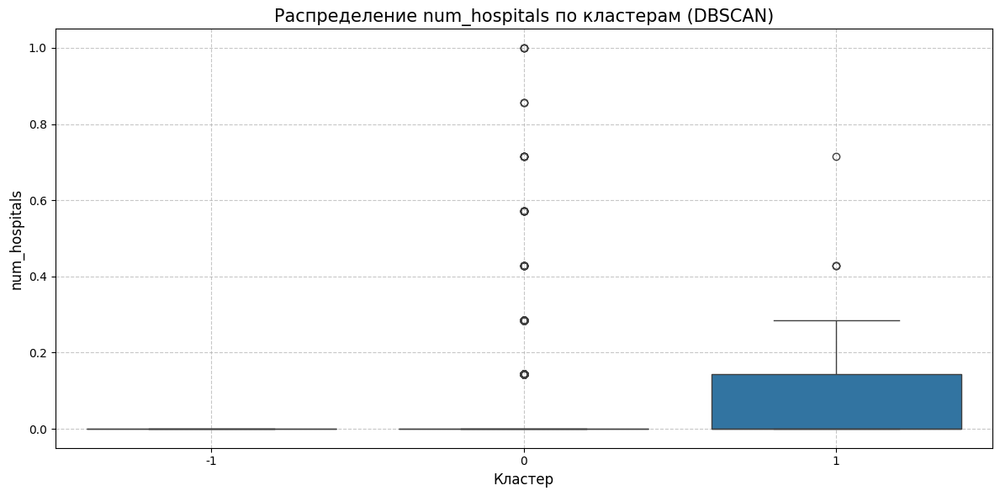

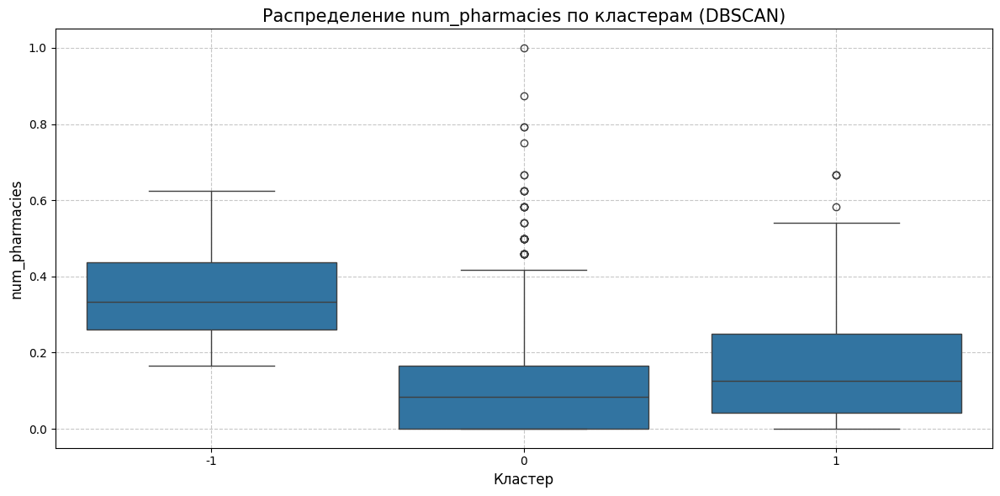

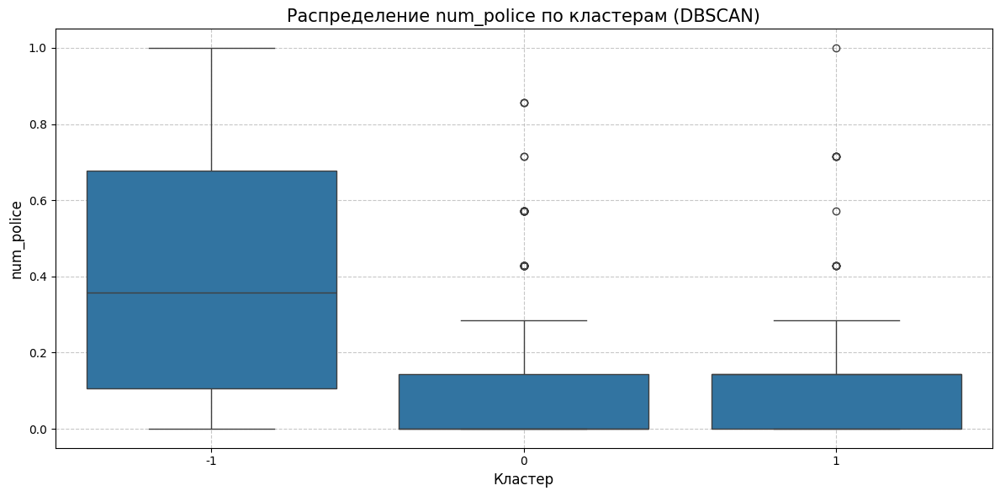

...

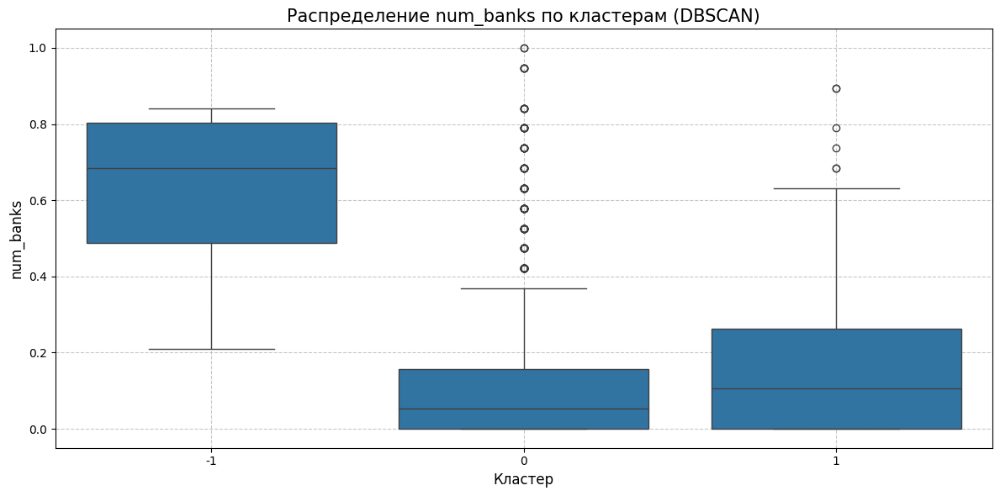

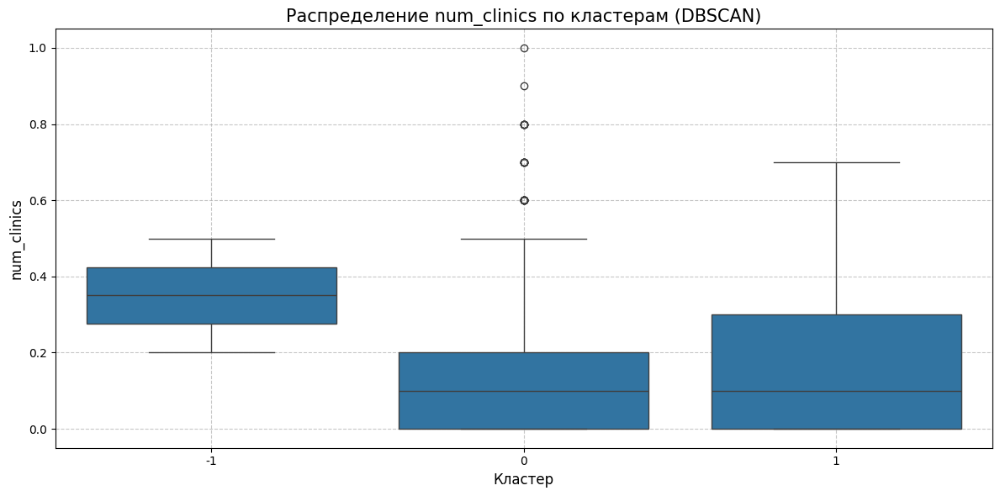

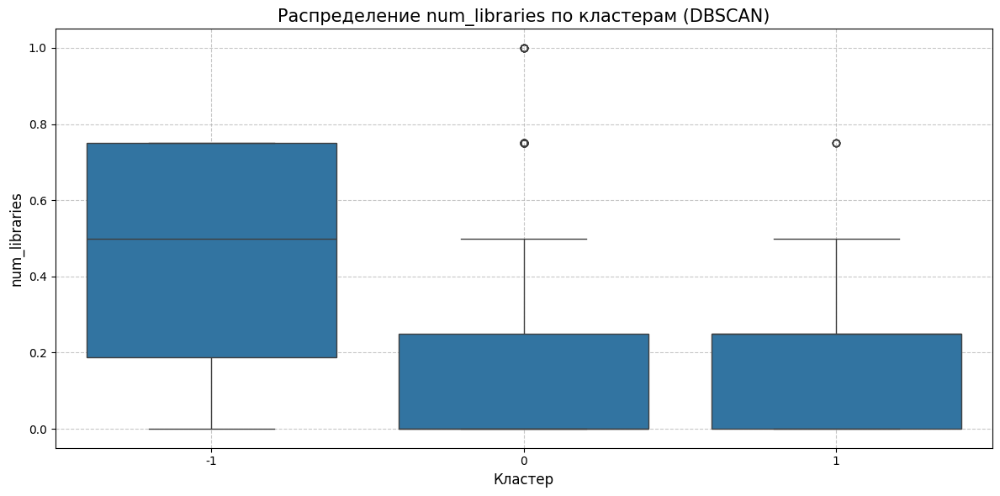

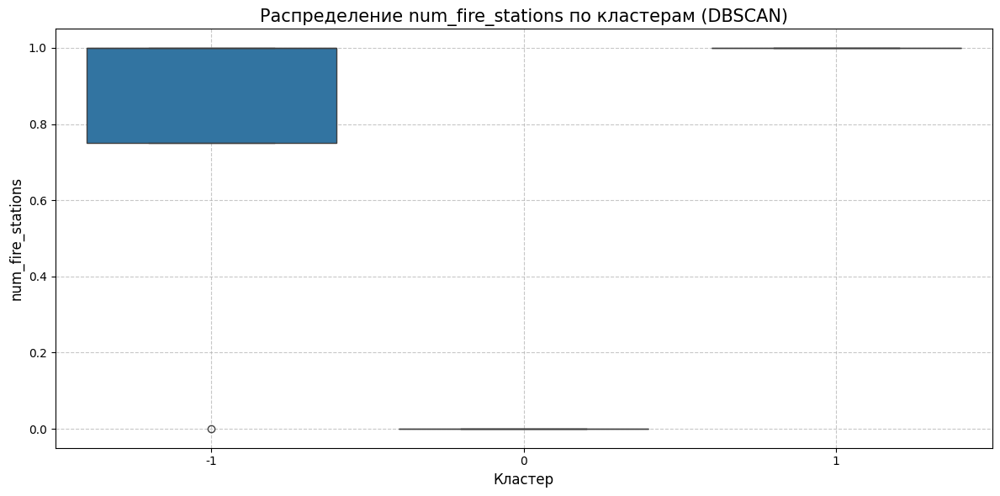

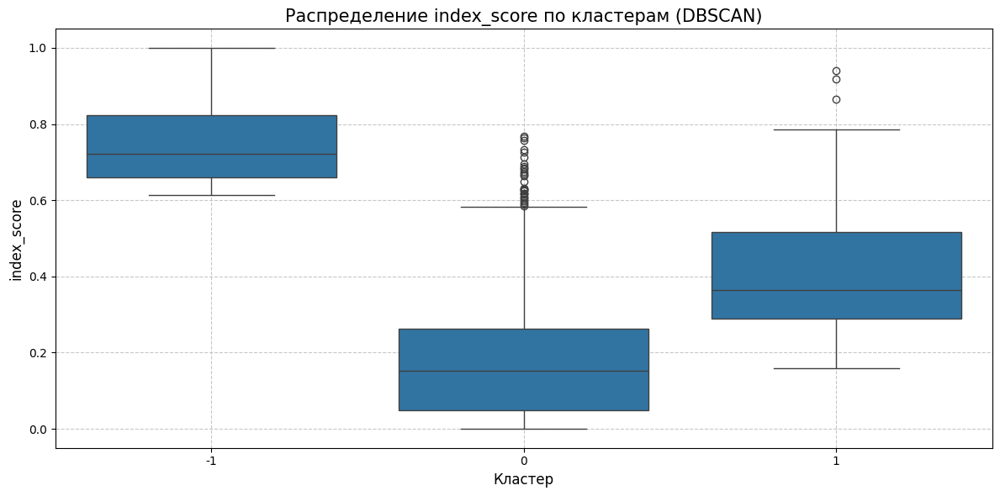

In [ ]:
# Анализ кластеров
dbscan_analysis = analyze_clusters(X_scaled, dbscan_labels, "DBSCAN", features)

### 3.5. HDBSCAN

In [ ]:
import hdbscan

# Применение HDBSCAN
hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
hdbscan_labels = hdbscan_clusterer.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
hdbscan_metrics = evaluate_clustering(X_scaled, hdbscan_labels, "HDBSCAN")


Метрики качества кластеризации для HDBSCAN:
Количество кластеров: 33
Silhouette Score: -0.0538
Calinski-Harabasz Index: 34.3666
Davies-Bouldin Index: 1.2922


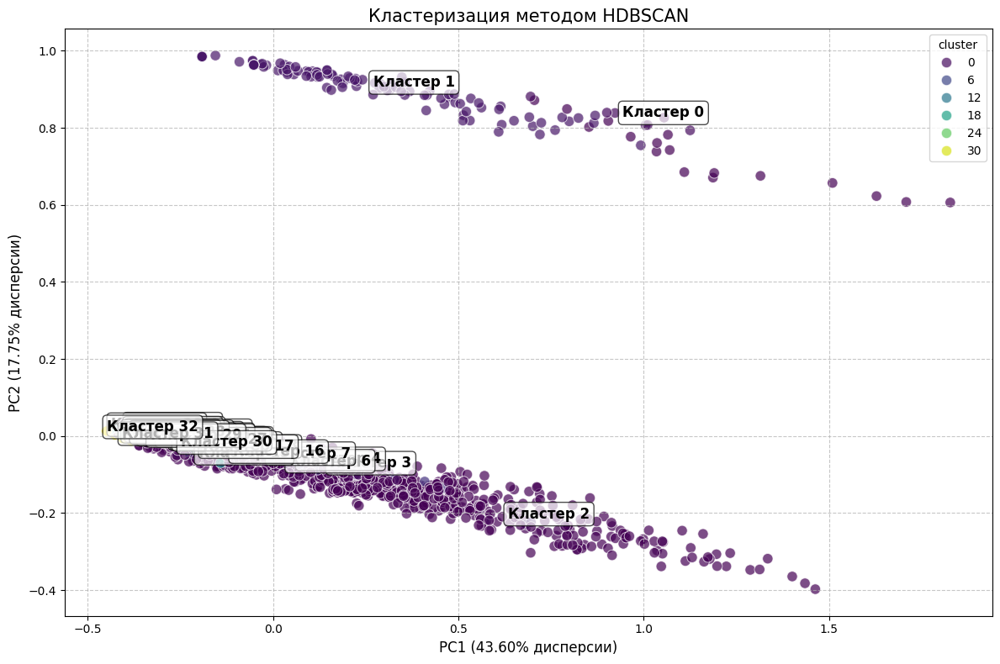

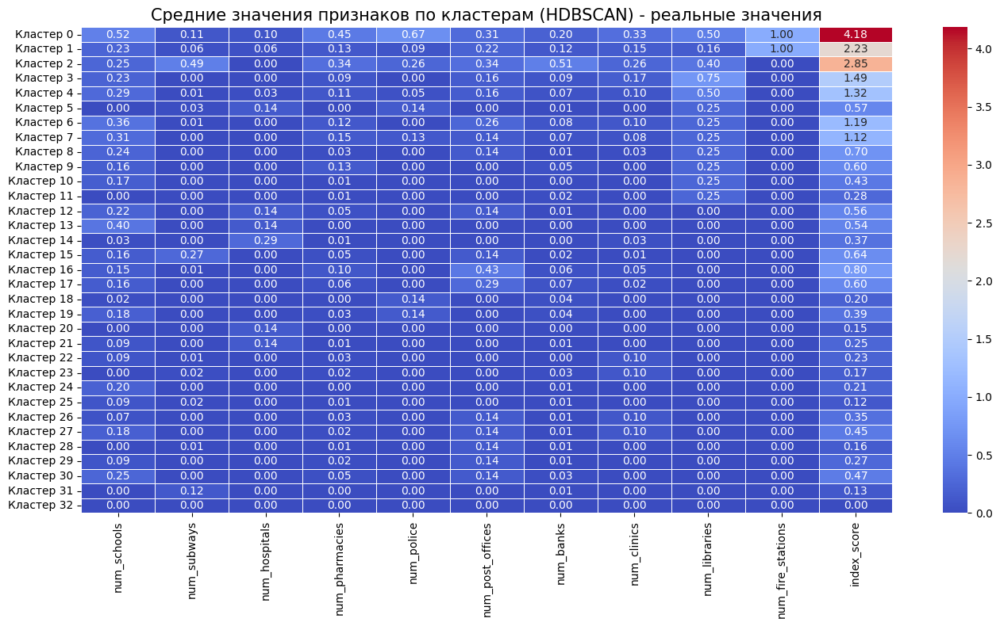

array([0.43596157, 0.17749925])

In [ ]:
visualize_clusters_2d(
    X_scaled,
    hdbscan_labels,
    "HDBSCAN",
    features,
    X_original=h3_gdf[features].values if all(f in h3_gdf.columns for f in features) else None
)


--- Анализ кластеров для метода HDBSCAN ---
Количество кластеров: 33

Распределение точек по кластерам:


,Количество точек,Процент
-1,1182,61.40
0,6,0.31
1,106,5.51
2,5,0.26
3,8,0.42
4,50,2.60
5,5,0.26
6,5,0.26
7,10,0.52
8,19,0.99



Средние значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,0.306107,0.146249,0.066594,0.171602,0.108170,0.250302,0.177799,0.162098,0.169205,0.015228,0.251224
0,0.515152,0.111111,0.095238,0.451389,0.666667,0.309524,0.201754,0.333333,0.500000,1.000000,0.668105
1,0.228988,0.061006,0.057951,0.130503,0.086253,0.223720,0.119662,0.154717,0.162736,1.000000,0.355361
2,0.254545,0.493333,0.000000,0.341667,0.257143,0.342857,0.505263,0.260000,0.400000,0.000000,0.455840
3,0.227273,0.000000,0.000000,0.088542,0.000000,0.160714,0.092105,0.175000,0.750000,0.000000,0.238495
4,0.290909,0.008000,0.025714,0.112500,0.054286,0.157143,0.074737,0.096000,0.500000,0.000000,0.210657
5,0.000000,0.026667,0.142857,0.000000,0.142857,0.000000,0.010526,0.000000,0.250000,0.000000,0.091479
6,0.363636,0.013333,0.000000,0.125000,0.000000,0.257143,0.084211,0.100000,0.250000,0.000000,0.190543
7,0.309091,0.000000,0.000000,0.145833,0.128571,0.142857,0.068421,0.080000,0.250000,0.000000,0.179598



Минимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.013306
0,0.363636,0.000000,0.000000,0.166667,0.428571,0.142857,0.105263,0.3,0.50,1.0,0.571383
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,1.0,0.159674
2,0.181818,0.400000,0.000000,0.208333,0.142857,0.285714,0.421053,0.2,0.25,0.0,0.425076
3,0.181818,0.000000,0.000000,0.041667,0.000000,0.142857,0.052632,0.1,0.75,0.0,0.202623
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.50,0.0,0.094353
5,0.000000,0.000000,0.142857,0.000000,0.142857,0.000000,0.000000,0.0,0.25,0.0,0.085540
6,0.272727,0.000000,0.000000,0.083333,0.000000,0.142857,0.052632,0.1,0.25,0.0,0.166874
7,0.272727,0.000000,0.000000,0.125000,0.000000,0.142857,0.052632,0.0,0.25,0.0,0.157451



Максимальные значения признаков по кластерам:


,num_schools,num_subways,num_hospitals,num_pharmacies,num_police,num_post_offices,num_banks,num_clinics,num_libraries,num_fire_stations,index_score
cluster,,,,,,,,,,,
-1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.00,1.0,1.000000
0,0.727273,0.133333,0.285714,0.666667,0.714286,0.428571,0.263158,0.4,0.50,1.0,0.734317
1,0.727273,0.533333,0.428571,0.541667,0.428571,0.857143,0.526316,0.7,0.75,1.0,0.689518
2,0.363636,0.533333,0.000000,0.458333,0.285714,0.428571,0.631579,0.3,0.50,0.0,0.484953
3,0.363636,0.000000,0.000000,0.166667,0.000000,0.285714,0.263158,0.2,0.75,0.0,0.271083
4,0.636364,0.133333,0.142857,0.333333,0.285714,0.428571,0.210526,0.2,0.50,0.0,0.361352
5,0.000000,0.133333,0.142857,0.000000,0.142857,0.000000,0.052632,0.0,0.25,0.0,0.115234
6,0.454545,0.066667,0.000000,0.166667,0.000000,0.285714,0.105263,0.1,0.25,0.0,0.209103
7,0.363636,0.000000,0.000000,0.208333,0.142857,0.142857,0.105263,0.2,0.25,0.0,0.201240


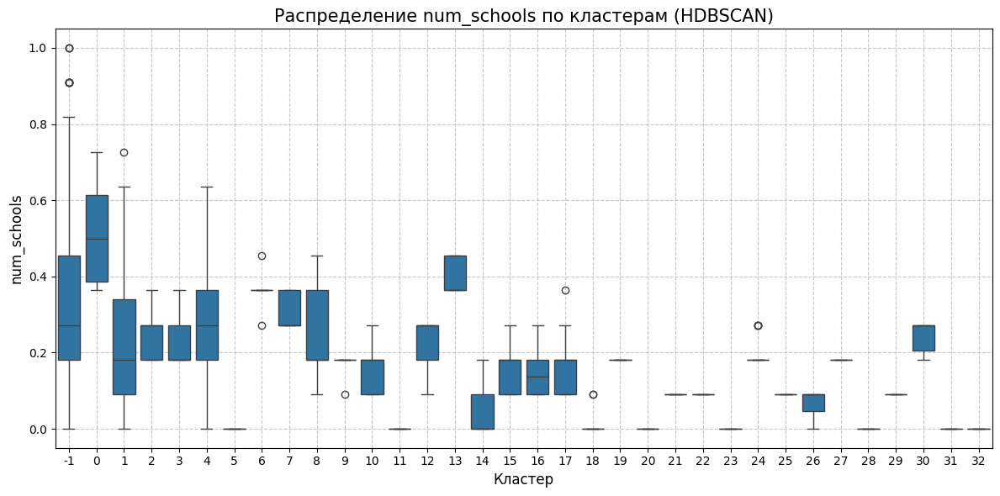

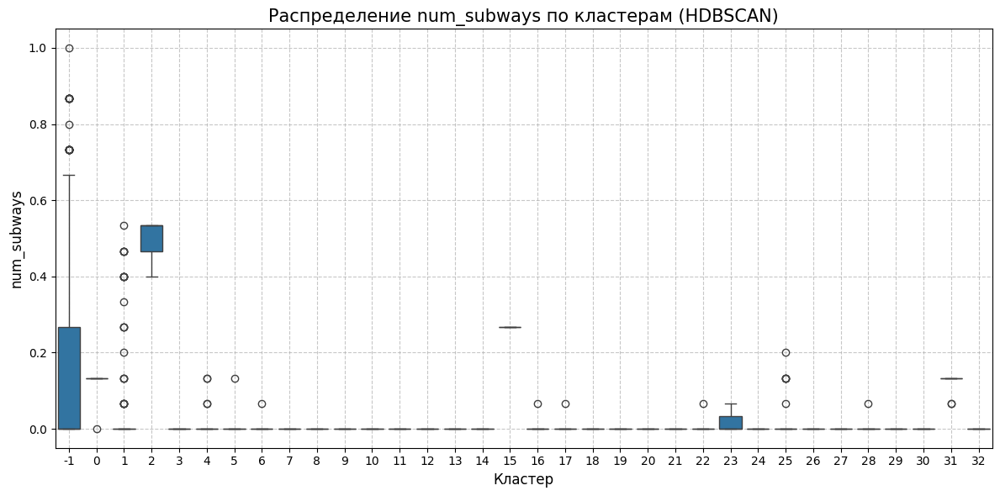

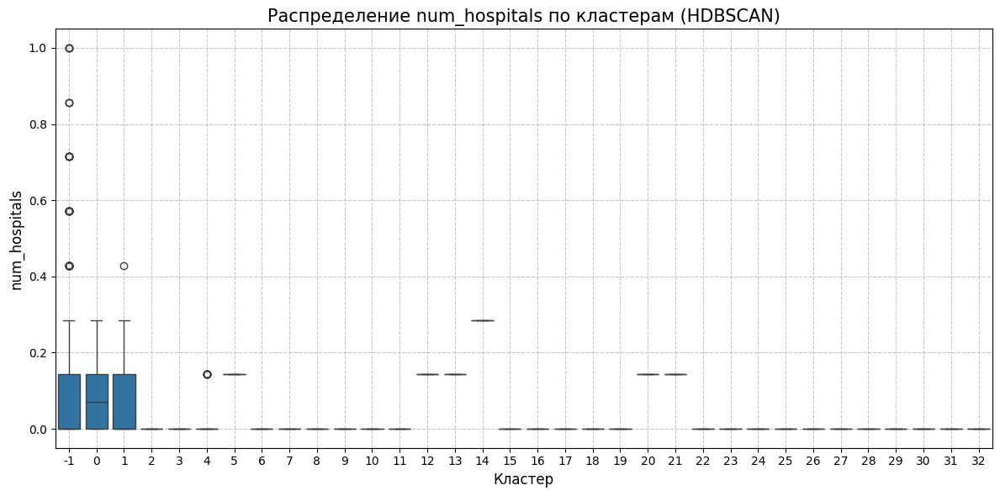

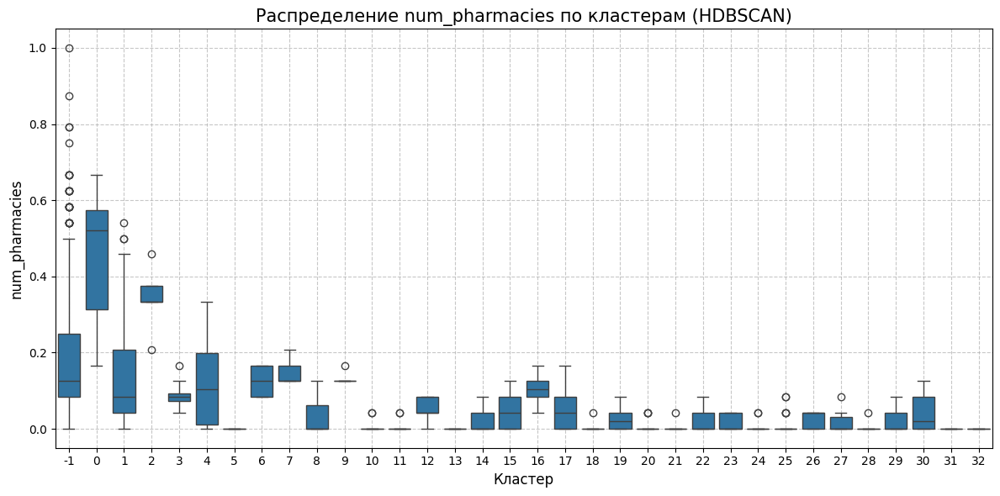

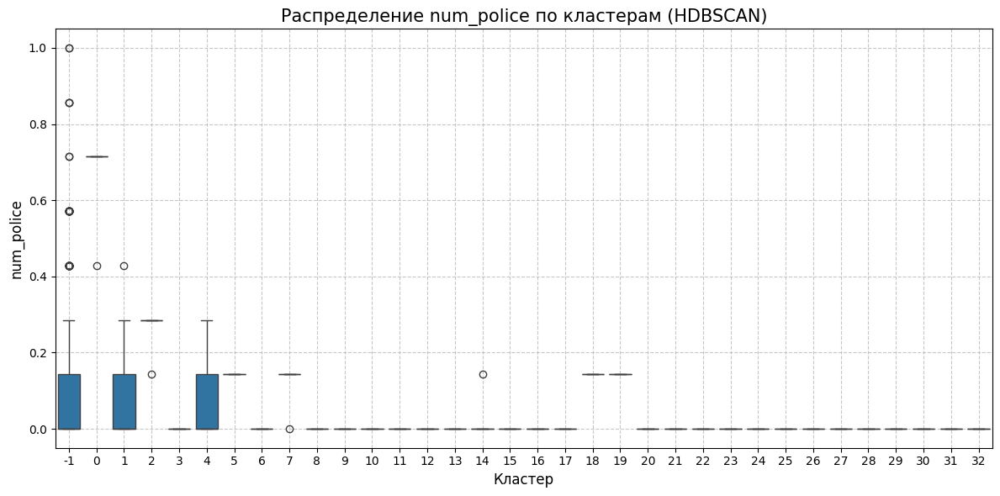

...

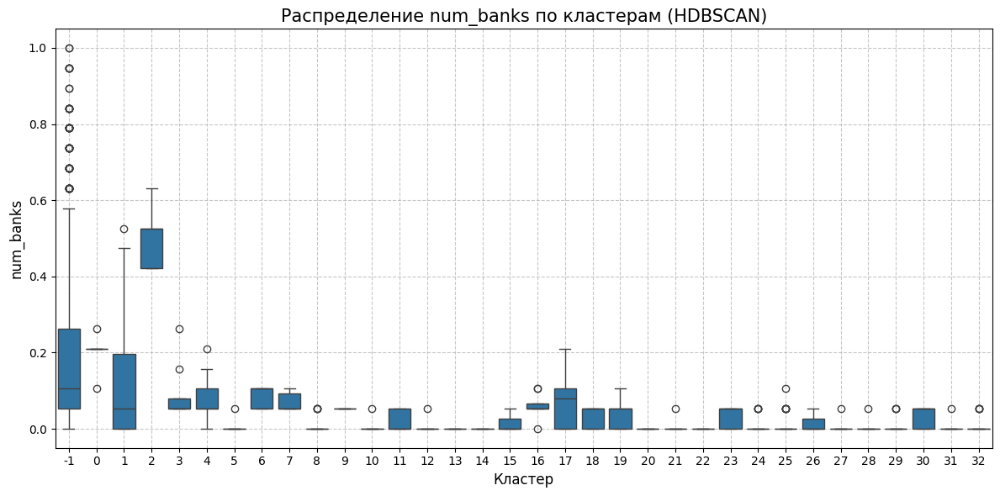

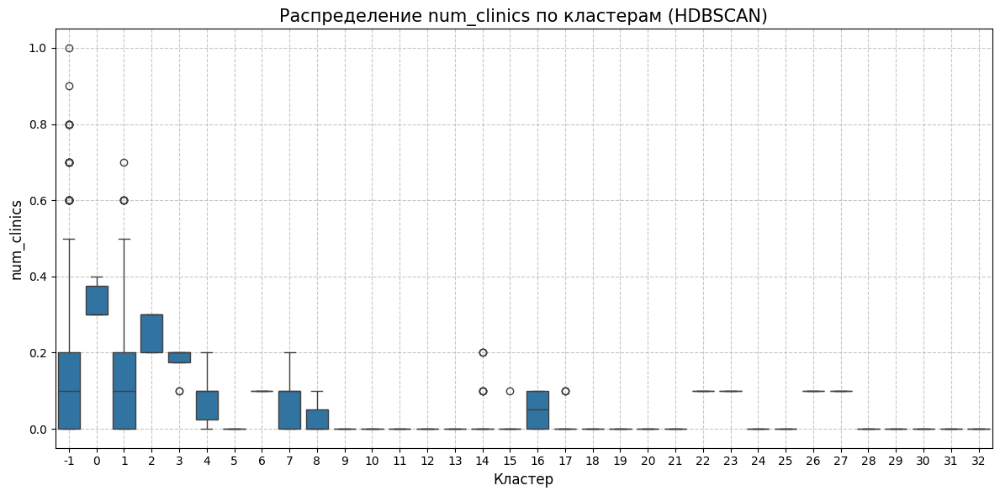

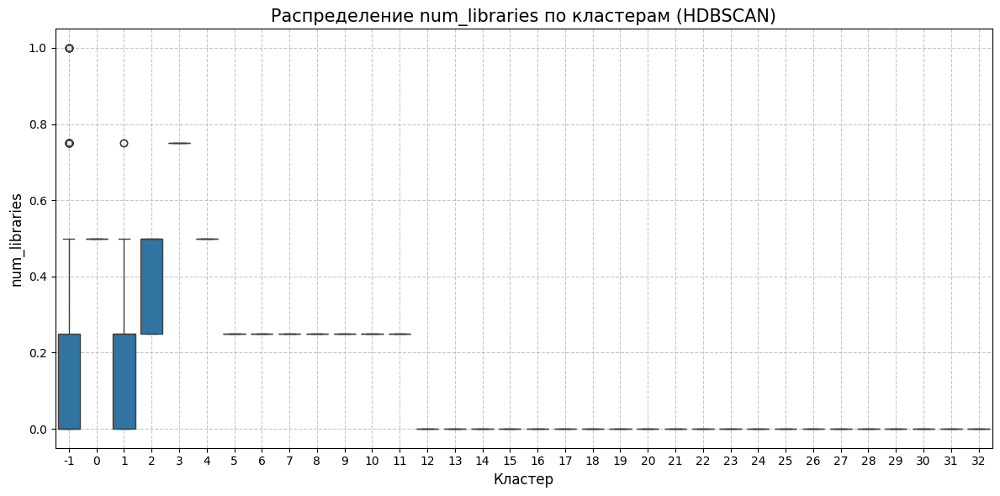

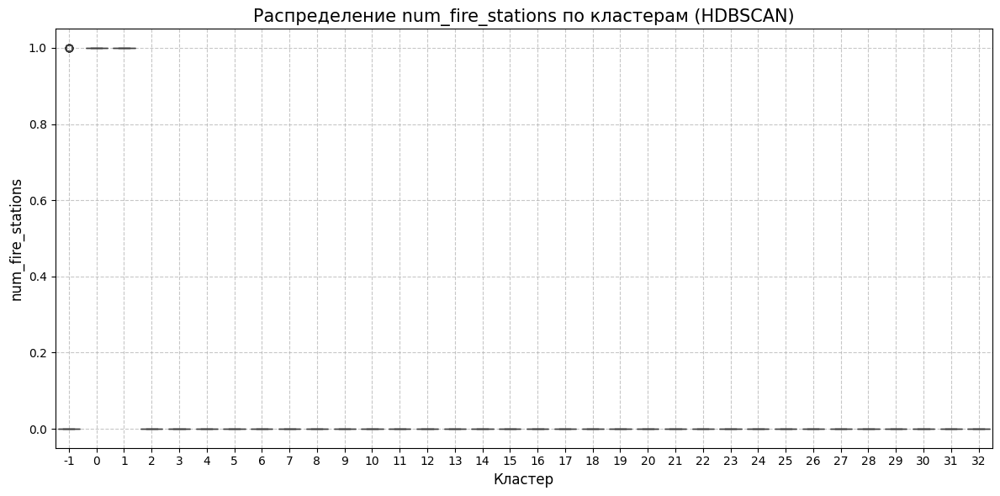

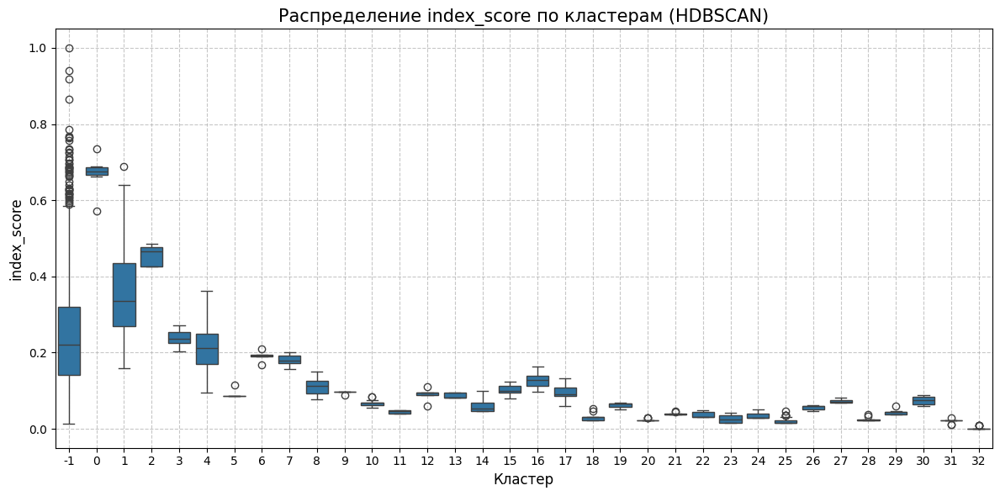

In [ ]:
# Анализ кластеров
hdbscan_analysis = analyze_clusters(X_scaled, hdbscan_labels, "HDBSCAN", features)

## **4. Сравнение результатов кластеризации и выбор оптимального алгоритма**

In [ ]:
# Создаем таблицу сравнения алгоритмов кластеризации
comparison_data = []

# K-means
comparison_data.append({
    'Алгоритм': 'K-means',
    'Количество кластеров': len(np.unique(kmeans_labels)),
    'Silhouette Score': kmeans_metrics['silhouette'],
    'Calinski-Harabasz': kmeans_metrics['calinski'],
    'Davies-Bouldin': kmeans_metrics['davies']
})

# Агломеративная кластеризация
comparison_data.append({
    'Алгоритм': 'Агломеративная',
    'Количество кластеров': len(np.unique(agglom_labels)),
    'Silhouette Score': agglom_metrics['silhouette'],
    'Calinski-Harabasz': agglom_metrics['calinski'],
    'Davies-Bouldin': agglom_metrics['davies']
})

# Спектральная кластеризация
comparison_data.append({
    'Алгоритм': 'Спектральная',
    'Количество кластеров': len(np.unique(spectral_labels)),
    'Silhouette Score': spectral_metrics['silhouette'],
    'Calinski-Harabasz': spectral_metrics['calinski'],
    'Davies-Bouldin': spectral_metrics['davies']
})

# DBSCAN
n_clusters_dbscan = len(np.unique(dbscan_labels))
if -1 in dbscan_labels:
    n_clusters_dbscan -= 1
comparison_data.append({
    'Алгоритм': 'DBSCAN',
    'Количество кластеров': n_clusters_dbscan,
    'Silhouette Score': dbscan_metrics['silhouette'],
    'Calinski-Harabasz': dbscan_metrics['calinski'],
    'Davies-Bouldin': dbscan_metrics['davies']
})

# HDBSCAN
n_clusters_hdbscan = len(np.unique(hdbscan_labels))
if -1 in hdbscan_labels:
    n_clusters_hdbscan -= 1
comparison_data.append({
    'Алгоритм': 'HDBSCAN',
    'Количество кластеров': n_clusters_hdbscan,
    'Silhouette Score': hdbscan_metrics['silhouette'],
    'Calinski-Harabasz': hdbscan_metrics['calinski'],
    'Davies-Bouldin': hdbscan_metrics['davies']
})

# Создаем DataFrame с результатами сравнения
comparison_df = pd.DataFrame(comparison_data)

Рекомендации по выбору алгоритма:

1. Высокие значения Silhouette Score и Calinski-Harabasz указывают на хорошее качество кластеризации
2. Низкие значения Davies-Bouldin указывают на хорошее качество кластеризации
3. DBSCAN и HDBSCAN могут идентифицировать шумовые точки и кластеры произвольной формы
4. K-means и Агломеративная кластеризация обычно дают компактные и хорошо разделенные кластеры

In [ ]:
# Выводим таблицу сравнения
print("Сравнение алгоритмов кластеризации:")
display(comparison_df)

Сравнение алгоритмов кластеризации:


,Алгоритм,Количество кластеров,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,K-means,3,0.368271,790.333348,1.222330
1,Агломеративная,3,0.372717,709.807603,1.252495
2,Спектральная,3,0.017162,356.551764,1.006009
3,DBSCAN,2,0.475348,247.604517,1.209526
4,HDBSCAN,33,-0.053786,34.366616,1.292206


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Результаты кластеризации с использованием **K-means**, агломеративной и спектральной кластеризации, рассчитанных на выделение **пяти кластеров**, демонстрируют сбалансированное распределение данных. Умеренные значения **Silhouette**, **Calinski–Harabasz** и **Davies–Bouldin** свидетельствуют о достаточной компактности и разумном разделении групп, что обеспечивает стабильное представление внутренней структуры данных.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;В то же время, плотностной метод **DBSCAN**, выделивший **три кластера**, показал высокий Silhouette score, указывающий на чёткое разделение обнаруженных областей, однако низкое значение Calinski–Harabasz говорит о слабой проработке внутрикластерной структуры. Это можно объяснить его **чувствительностью к параметрам**, таким как радиус соседства и минимальное число точек, что приводит к объединению нескольких естественных групп в одну из-за выбранного порога плотности.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Особо неадекватным оказался результат работы **HDBSCAN**, который сформировал **260 кластеров** с **отрицательным Silhouette score**. Это указывает на чрезмерное дробление данных, возникающее из-за неустойчивого определения плотности в условиях пространственных данных, где наблюдаются **неоднородное распределение** и **размытые границы** между группами.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Таким образом, при кластеризации пространственных данных методы, требующие явного задания числа кластеров, часто дают более интерпретируемую и стабильную структуру, в то время как плотностные алгоритмы склонны к некорректной интерпретации из-за своей чувствительности к параметрам и особенностям распределения данных.

In [ ]:
# Выбираем алгоритм с наивысшим Calinski-Harabasz
best_algorithm_idx = comparison_df['Calinski-Harabasz'].idxmax()
best_algorithm = comparison_df.iloc[best_algorithm_idx]['Алгоритм']

print(f"\nАлгоритм с наилучшим Calinski-Harabasz: {best_algorithm}")


Алгоритм с наилучшим Calinski-Harabasz: K-means


In [ ]:
# Выбираем алгоритм с наивысшим Calinski-Harabasz
best_algorithm_idx = comparison_df['Calinski-Harabasz'].idxmax()
best_algorithm = comparison_df.iloc[best_algorithm_idx]['Алгоритм']

print(f"\nАлгоритм с наилучшим Calinski-Harabasz: {best_algorithm}")

# Создаем словарь доступных алгоритмов и их меток
available_algorithms = {
    'K-means': kmeans_labels if 'kmeans_labels' in locals() else None,
    'Агломеративная': agglom_labels if 'agglom_labels' in locals() else None,
    'DBSCAN': dbscan_labels if 'dbscan_labels' in locals() else None,
}

# Проверяем, доступен ли выбранный алгоритм
if best_algorithm in available_algorithms and available_algorithms[best_algorithm] is not None:
    best_labels = available_algorithms[best_algorithm]
    print(f"Успешно выбраны метки от алгоритма {best_algorithm}")
else:
    print(f"Внимание: алгоритм {best_algorithm} недоступен. Используем альтернативный.")
    # Выбираем первый доступный алгоритм
    for algo_name, algo_labels in available_algorithms.items():
        if algo_labels is not None:
            best_labels = algo_labels
            print(f"Используем метки от алгоритма {algo_name}")
            break


Алгоритм с наилучшим Calinski-Harabasz: K-means
Успешно выбраны метки от алгоритма K-means


## **5. Интерпретация результатов кластеризации городской территории методом K-means**

### **Общее распределение территории**



Кластеризация выявила 5 типов городских территорий с неравномерным распределением:

| Кластер | Количество точек | Процент территории |
|---------|-----------------|-------------------|
| 0       | 2623            | 40.14%            |
| 1       | 1898            | 29.05%            |
| 2       | 616             | 9.43%             |
| 3       | 267             | 4.09%             |
| 4       | 1130            | 17.29%            |


### **Вывод**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Результаты кластеризации показывают значительное неравенство в развитии городских территорий. Приоритетной задачей является развитие неосвоенных районов (кластер 0), занимающих 40% территории города. При этом опыт успешных зон (кластеры 2 и 3) следует использовать как модель для развития остальных территорий.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Комплексный подход к реализации предложенных стратегий позволит создать более сбалансированную городскую среду, повысить качество жизни населения и обеспечить устойчивое развитие всех районов города.

## **6. Визуализация результатов лучшего алгоритма на карте и сохранение в GeoJSON**

In [ ]:
# Добавляем метки кластеров в исходный GeoDataFrame
h3_gdf['cluster'] = best_labels

# Создаем карту с кластерами
map_clusters = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=12)
map_clusters.add_data(
    h3_gdf,
    column="cluster",
    cmap="OrRd",
    scheme='EqualInterval',
    legend_title="Кластеры",
    layer_name="H3 Кластеризация",
    style={
        "stroke": False,
        "weight": 0.5,
        "fillOpacity": 0.7,
    }
)

# Отображаем карту
map_clusters

Map(center=[55.8269, 37.581599999999995], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_…

In [ ]:
# Сохраняем результаты кластеризации в GeoJSON
h3_gdf.to_file("h3_clusters.geojson", driver='GeoJSON')
print("Результаты кластеризации сохранены в файл 'h3_clusters.geojson'")

Результаты кластеризации сохранены в файл 'h3_clusters.geojson'


## **7. Обучение моделей классификации на основе результатов кластеризации**

Теперь, когда у нас есть метки кластеров, мы можем обучить различные модели классификации для предсказания кластеров на основе признаков гексагонов.

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
import joblib

In [ ]:
# Подготовка данных для классификации
# Если в данных есть шумовые точки (-1), мы их исключаем
if -1 in best_labels:
    mask = best_labels != -1
    X_filtered = X_scaled[mask]
    y_filtered = best_labels[mask]
else:
    X_filtered = X_scaled
    y_filtered = best_labels

# Разделяем данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_filtered, test_size=0.3, random_state=42, stratify=y_filtered
)

print(f"Размер обучающей выборки: {X_train.shape[0]} образцов")
print(f"Размер тестовой выборки: {X_test.shape[0]} образцов")

Размер обучающей выборки: 1347 образцов
Размер тестовой выборки: 578 образцов


In [ ]:
# Словарь с классификаторами
classifiers = {
    'Логистическая регрессия': LogisticRegression(max_iter=1000, random_state=42),
    'Дерево решений': DecisionTreeClassifier(random_state=42),
    'Случайный лес': RandomForestClassifier(random_state=42),
    'Градиентный бустинг': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'K-ближайших соседей': KNeighborsClassifier(),
    'Наивный Байес': GaussianNB(),
}

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;В блоке кода ниже происходит **обучение** и **оценка** моделей классификации объявленных выше. Сначала создаётся список для хранения результатов, затем для каждой модели из словаря classifiers выполняется обучение на тренировочных данных и предсказание на тестовой выборке. После этого рассчитываются основные метрики качества, такие как **точность (accuracy)**, **точность (precision)**, **полнота (recall)** и **F1-мера**, а также проводится кросс-валидация в 5-кратном разбиении данных. Полученные результаты сохраняются в виде словарей, которые затем объединяются в DataFrame и сортируются по F1-мере для удобного сравнения моделей. Такой подход позволяет быстро оценить эффективность каждого классификатора и выбрать наиболее подходящую модель для дальнейшей работы.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Использование кросс-валидации позволяет получить более **объективную оценку** производительности модели, так как данные используются максимально эффективно: каждая часть выборки поочередно служит и для обучения, и для тестирования. Это обеспечивает **устойчивость и надёжность** метрик, снижая влияние случайного разбиения данных, а также помогает обнаружить и предотвратить переобучение, поскольку каждая модель проверяется на **нескольких независимых подвыборках**.


In [ ]:
# Обучение и оценка моделей
results = []

for name, clf in classifiers.items():
    print(f"\nОбучение модели: {name}...")

    # Обучение модели
    clf.fit(X_train, y_train)

    # Предсказание на тестовой выборке
    y_pred = clf.predict(X_test)

    # Расчет метрик
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Кросс-валидация
    cv_scores = cross_val_score(clf, X_filtered, y_filtered, cv=5, scoring='f1_weighted')
    cv_f1 = cv_scores.mean()

    # Сохраняем результаты
    results.append({
        'Модель': name,
        'Точность (accuracy)': accuracy,
        'Полнота (recall)': recall,
        'Точность (precision)': precision,
        'F1-мера': f1,
        'F1-мера (CV)': cv_f1,
        'Классификатор': clf
    })

# Создаем DataFrame с результатами
results_df = pd.DataFrame([
    {k: v for k, v in r.items() if k != 'Классификатор'}
    for r in results
])

# Сортируем по F1-мере
results_df = results_df.sort_values(by='F1-мера (CV)', ascending=False)

# Выводим таблицу результатов
print("\nРезультаты классификации (сортировка по F1-мере):")
results_df


Обучение модели: Логистическая регрессия...

Обучение модели: Дерево решений...

Обучение модели: Случайный лес...

Обучение модели: Градиентный бустинг...

Обучение модели: AdaBoost...

Обучение модели: SVM...

Обучение модели: K-ближайших соседей...

Обучение модели: Наивный Байес...

Результаты классификации (сортировка по F1-мере):


,Модель,Точность (accuracy),Полнота (recall),Точность (precision),F1-мера,F1-мера (CV)
0,Логистическая регрессия,0.993080,0.993080,0.993104,0.993060,0.993219
5,SVM,0.987889,0.987889,0.988000,0.987913,0.986504
3,Градиентный бустинг,0.977509,0.977509,0.978316,0.977636,0.985992
2,Случайный лес,0.968858,0.968858,0.969607,0.969017,0.982866
1,Дерево решений,0.974048,0.974048,0.974615,0.974165,0.978687
4,AdaBoost,0.975779,0.975779,0.976461,0.975902,0.973454
6,K-ближайших соседей,0.961938,0.961938,0.962284,0.961603,0.963352
7,Наивный Байес,0.946367,0.946367,0.951827,0.947117,0.956353


In [ ]:
# Выбираем лучшую модель
best_model_name = results_df.iloc[0]['Модель']
best_model_idx = [r['Модель'] for r in results].index(best_model_name)
best_model = results[best_model_idx]['Классификатор']
print(f"\nЛучшая модель: {best_model_name} с F1-мерой: {results_df.iloc[0]['F1-мера (CV)']:.4f}")


Лучшая модель: Логистическая регрессия с F1-мерой: 0.9932


In [ ]:
# Детальный анализ лучшей модели на тестовых данных
y_pred_best = best_model.predict(X_test)

print("\nОтчёт о классификации для лучшей модели:")
print(classification_report(y_test, y_pred_best))


Отчёт о классификации для лучшей модели:
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        39
           1       0.99      1.00      1.00       357
           2       0.99      0.98      0.99       182

    accuracy                           0.99       578
   macro avg       1.00      0.99      0.99       578
weighted avg       0.99      0.99      0.99       578



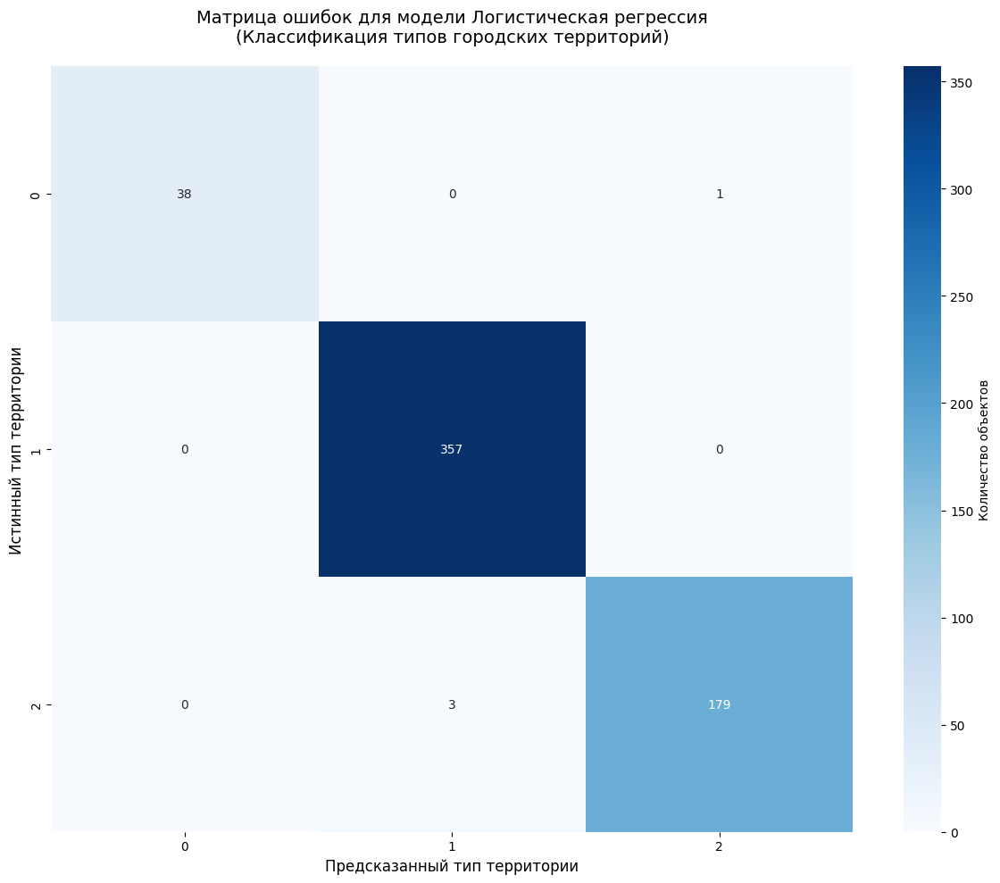


Анализ матрицы ошибок:
Всего объектов в тестовой выборке: 578
Правильных предсказаний: 574 (99.3%)
Ошибок классификации: 4 (0.7%)

Наиболее частая ошибка:
  Кластер 2 → ошибочно предсказан как кластер 1
  Количество ошибок: 3 объектов


In [ ]:
# Визуализация матрицы ошибок
cm = pd.crosstab(y_test, y_pred_best, rownames=['Истинные'], colnames=['Предсказанные'])

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            cbar_kws={'label': 'Количество объектов'})

plt.title(f'Матрица ошибок для модели {best_model_name}\n(Классификация типов городских территорий)',
          fontsize=14, pad=20)
plt.xlabel('Предсказанный тип территории', fontsize=12)
plt.ylabel('Истинный тип территории', fontsize=12)
plt.tight_layout()
plt.show()

# Дополнительная статистика по ошибкам
print(f"\nАнализ матрицы ошибок:")
print(f"Всего объектов в тестовой выборке: {len(y_test)}")

# Диагональ - правильные предсказания
correct_predictions = cm.values.diagonal().sum()
print(f"Правильных предсказаний: {correct_predictions} ({correct_predictions/len(y_test)*100:.1f}%)")

# Сумма вне диагонали - ошибки
errors = len(y_test) - correct_predictions
print(f"Ошибок классификации: {errors} ({errors/len(y_test)*100:.1f}%)")

# Наиболее часто путаемые классы
if not cm.empty and cm.shape[0] > 1:
    cm_values = cm.values
    np.fill_diagonal(cm_values, 0)  # Обнуляем диагональ, чтобы найти максимальную ошибку
    max_error = cm_values.max()
    if max_error > 0:
        max_error_indices = np.where(cm_values == max_error)
        for i, j in zip(max_error_indices[0], max_error_indices[1]):
            true_label = cm.index[i]
            pred_label = cm.columns[j]
            print(f"\nНаиболее частая ошибка:")
            print(f"  Кластер {true_label} → ошибочно предсказан как кластер {pred_label}")
            print(f"  Количество ошибок: {max_error} объектов")

In [ ]:
# Сохраняем лучшую модель
joblib.dump(best_model, 'best_classification_model.joblib')
print(f"\nЛучшая модель сохранена как 'best_classification_model.joblib'")


Лучшая модель сохранена как 'best_classification_model.joblib'


## **8. Пример использования модели для классификации новых данных**

In [ ]:
# Функция для предсказания кластера для новых данных
def predict_cluster(model, new_data, scaler=None):
    """
    Предсказывает кластер для новых данных с использованием обученной модели

    Параметры:
    model -- обученная модель классификации
    new_data -- новые данные для классификации (должны содержать те же признаки, что и обучающие данные)
    scaler -- объект скейлера для масштабирования данных (если требуется)

    Возвращает:
    Предсказанные метки кластеров
    """
    # Масштабирование новых данных, если предоставлен скейлер
    if scaler is not None:
        new_data_scaled = scaler.transform(new_data)
    else:
        new_data_scaled = new_data

    # Предсказание кластера
    cluster_predictions = model.predict(new_data_scaled)

    return cluster_predictions

In [ ]:
# Пример использования модели для классификации новых данных
# Для демонстрации используем 5 примеров из тестовой выборки
sample_data = X_test[:5]

# Предсказания
predictions = predict_cluster(best_model, sample_data, scaler)

print("\nПримеры классификации новых данных:")
for i, pred in enumerate(predictions):
    print(f"Пример {i+1} -> Кластер {pred}")


Примеры классификации новых данных:
Пример 1 -> Кластер 1
Пример 2 -> Кластер 2
Пример 3 -> Кластер 2
Пример 4 -> Кластер 0
Пример 5 -> Кластер 1


## **Заключение**



&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;В данном проекте выполнен пространственный анализ пешеходной доступности городских сервисов с применением методов машинного обучения к данным, агрегированным по гексагональной сетке H3. Такой подход позволил выявить пространственные закономерности в распределении 10 ключевых категорий городской инфраструктуры и определить типы городских территорий по уровню обеспеченности базовыми сервисами.
&nbsp;&nbsp;&nbsp;&nbsp;


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Используя комплекс метрик качества кластеризации, определено оптимальное количество кластеров, после чего проведено сравнение эффективности различных алгоритмов (K-means, агломеративная кластеризация, DBSCAN) для сегментации территории по показателям доступности образовательных, медицинских, транспортных, финансовых и административных услуг в пешеходной доступности.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Результаты кластеризации визуализированы с помощью методов снижения размерности и тепловых карт, что позволило интерпретировать выявленные кластеры как содержательные типы городских пространств с различными характеристиками доступности сервисов. На основе оптимального алгоритма кластеризации обучены модели классификации, способные автоматически определять тип городской территории по её инфраструктурным характеристикам.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Данный анализ демонстрирует, как применение методов машинного обучения в пространственном анализе позволяет не только картографировать распределение сервисов, но и количественно оценивать равенство доступа к городской инфраструктуре, выявлять территории с дефицитом основных услуг и формировать аналитическую основу для разработки дифференцированных стратегий городского развития, ориентированных на повышение качества жизни и пешеходной доступности.


